faktorid:
- piirkond 
- mitu treeingandmepuntki on
	- piirkonnas
	- kokku
- bpointide arv piirkonnas (+-lisa nt50%)

mõõdikud
- piirkonna treening- vs testviga
  - * treening vs test abs ja suht
  - samadel X, erineva müraga
  - X_grid
- 2-3 e. abs vahe
- (2-3)/3 e. suhteline vahe

- 2-3test e. abs vahe
- (2-3test)/3test e. suhteline vahe 
	
TODO lisada 5xrmse plotile 3test ja 3train

eesmärk: faktoritest lähtuvalt leida testviga, mis intuitiivselt töötaks


- vähem andmeid =? suurem ülesobitus (testviga>>treening).
  - ülesobitus sümptom 2: 2 hakkab väiksemaks  kui 3. 
  - kui palju 2<3 versus treening&test **MSE** erinevus. **uurimisküsimus**
  - kas 2miinus3 on seotud treening-test viga -> 3 ongi testviga ehk kas 2 on treeningviga. 
	- **vahe muutumine andmete suurusega seoses. kuidas 2 on treeningveaga sõltuvuses. .võib ka vaadata 2-3 märki, kui on väikesem siis on liiga enesekindel & vice versa**
	- **vahet saaks vaadata eri kohtades. kõik eelnev nii globaalne kui ka lookaalne**
		- **kas serva efekt eksisteerib**
  - ei ole vaja ette geneda kõike
        

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
%cd ..

c:\Users\troosma\Documents\Ylikool\6. semester\Bakatöö\bakatoo


In [2]:
import sys
import os

import numpy as np
import pandas as pd
import random
import tensorflow as tf

from tensorflow import keras
from keras import layers

from matplotlib import pyplot as plt
import seaborn as sns

from scripts.CustomCallbacks import CustomLogger
import scripts.utils as utils
import scripts.Slopes as Slopes

from tqdm import tqdm
import json
utils.reset_seeds(0)


In [3]:
df_columns = ['train_size', 'random_seed', 'multiplier', 'region',
              *[f'bpoints_in_{chr(a)}' for a in range(97, 97+5)],
              *[f'ext_bpoints_in_{chr(a)}' for a in range(97, 97+5)],
              *[f'abs_diff_in_{chr(a)}' for a in range(97, 97+5)],
              *[f'rel_diff_in_{chr(a)}' for a in range(97, 97+5)],
              *[f'raw_mean2_in_{chr(a)}' for a in range(97, 97+5)],
              *[f'raw_mean3_in_{chr(a)}' for a in range(97, 97+5)], ]

In [147]:
def process_break_points(file_path, regions):
    with open(file_path, 'rb') as f:
        data = np.load(f)
    # print(data)
    return np.histogram(data[:, 0], bins=regions)[0]


def process_break_points_laiem(file_path, regions):
    with open(file_path, 'rb') as f:
        data = np.load(f)
    # print(data[:,0])
    result = np.zeros(len(regions))
    for idx, reg in enumerate(regions):
        
        result[idx] = len(np.where((data[:, 0] >= reg[0])
                          & (data[:, 0] < reg[1]))[0])

        #print(len(np.where((data[:, 0] > reg[0]) & (data[:, 0] < reg[1]))[0]))
    return result


In [493]:
def process_rmse(file_path, regions):
    with open(file_path, 'rb') as f:
        data = np.load(f)

    # splitime andmed vastavalt regionitele jätame välja piirkonnad mis on väiksem ja suurem kui andmete piirid
    r_all = np.split(data, np.searchsorted(data[:, 0], v=regions))[1:-1]
    
    # absoluutsed vahed joonte 2. ja 3. vahel (keskmine piirkonnas)
    absoluut_vahed = [np.mean(r[:, 2] - r[:, 3]) for r in r_all]

    # 3. joone keskmine igas piirkonnas
    r3_mean = [np.mean(r[:, 3]) for r in r_all]
    # 2. joone keskmine igas piirkonnas
    r2_mean =  [np.mean(r[:, 2]) for r in r_all]

    # suhtelised vahed joonte 2. ja 3. vahel (keskmine piirkonnas)
    suhtelised_vahed = [absoluut / r_m for absoluut, r_m in zip(absoluut_vahed, r3_mean)]

    # print(r3_mean)
    # print(r3_mean[2:3])
    return absoluut_vahed, suhtelised_vahed, (r2_mean, r3_mean)

#process_rmse(os.path.join(dirpath, filename), [0.0, 2.0, 4.0, 6.0, 8.0, 10.00]) # see viimane peab olema mingi 0.01 suurem et see <= töötaks korralikult

In [494]:
def kogu_andmed_dfks(pathikene: str, df_columns: list[str]):
    root_dir = os.path.join(pathikene)
    plot_paths = []
    mse_paths = []
    regions = np.arange(0, 12, 2)
    # print(regions)

    _temp = []
    _cnt = 0
    for dirpath, dirnames, filenames in os.walk(root_dir):
        hist_bpoint = None
        hist_bpoint_laiem = None
        abs_diff = None
        rel_diff = None

        for filename in filenames:
            # print(os.path.join(dirpath, filename))
            # print(filenames)

            #print(f"train size: {train_size}, seed: {seed}, multiplier_region: {multiplier}, region {region}")

            if filename.endswith('.npy'):
                
                _cnt += 1
                head, multiplier_region = os.path.split(dirpath)
                head, seed = os.path.split(head)
                head, train_size = os.path.split(head)
                multiplier, region = float(multiplier_region[:-1]), multiplier_region[-1]
                if "bpoints" in filename:
                    hist_bpoint = process_break_points(os.path.join(dirpath, filename), regions)
                    hist_bpoint_laiem = process_break_points_laiem(os.path.join(dirpath, filename), [(-1, 3), (1, 5), (3, 7), (5, 9), (7, 11)])
                elif "rmses" in filename:
                    abs_diff, rel_diff, (raw_mean2, raw_mean3) = process_rmse(os.path.join(dirpath, filename), regions)
                elif "y_pred" in filename:
                    ...
        if hist_bpoint is not None and abs_diff is not None and rel_diff is not None and hist_bpoint_laiem is not None:
            _temp.append([train_size, seed, multiplier, region, *hist_bpoint, *hist_bpoint_laiem, *abs_diff, *rel_diff, *raw_mean2, *raw_mean3])

    df = pd.DataFrame(_temp, columns=df_columns)
    return df

# df1 = kogu_andmed_dfks("andmed\\uneven_arvutisse", df_columns)
# df2 = kogu_andmed_dfks("andmed\\uneven_arvutisse_2", df_columns)

In [4]:
df = pd.read_csv("andmed/order2_const.csv")
# df2= pd.read_csv("andmed/reverse_normal_const.csv")

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23750 entries, 0 to 23749
Data columns (total 34 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   train_size        23750 non-null  int64  
 1   random_seed       23750 non-null  int64  
 2   multiplier        23750 non-null  float64
 3   region            23750 non-null  object 
 4   bpoints_in_a      23750 non-null  int64  
 5   bpoints_in_b      23750 non-null  int64  
 6   bpoints_in_c      23750 non-null  int64  
 7   bpoints_in_d      23750 non-null  int64  
 8   bpoints_in_e      23750 non-null  int64  
 9   ext_bpoints_in_a  23750 non-null  float64
 10  ext_bpoints_in_b  23750 non-null  float64
 11  ext_bpoints_in_c  23750 non-null  float64
 12  ext_bpoints_in_d  23750 non-null  float64
 13  ext_bpoints_in_e  23750 non-null  float64
 14  abs_diff_in_a     23750 non-null  float64
 15  abs_diff_in_b     23750 non-null  float64
 16  abs_diff_in_c     23750 non-null  float6

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
train_size,23750.0,300.000000,476.413773,10.000000,50.000000,100.000000,250.000000,2000.000000
random_seed,23750.0,24.500000,14.431174,0.000000,12.000000,24.500000,37.000000,49.000000
multiplier,23750.0,1.550000,1.363847,0.250000,0.500000,1.000000,2.000000,4.000000
bpoints_in_a,23750.0,10.436674,3.143904,1.000000,8.000000,10.000000,12.000000,24.000000
bpoints_in_b,23750.0,3.107747,2.228355,0.000000,1.000000,3.000000,4.000000,17.000000
bpoints_in_c,23750.0,1.260084,1.245861,0.000000,0.000000,1.000000,2.000000,10.000000
bpoints_in_d,23750.0,0.593053,0.846306,0.000000,0.000000,0.000000,1.000000,8.000000
bpoints_in_e,23750.0,0.193937,0.476785,0.000000,0.000000,0.000000,0.000000,5.000000
ext_bpoints_in_a,23750.0,17.645389,3.986268,5.000000,15.000000,18.000000,20.000000,34.000000
ext_bpoints_in_b,23750.0,7.767116,3.598771,0.000000,5.000000,8.000000,10.000000,25.000000


In [8]:
df.random_seed.value_counts().where(lambda x: x < 950).dropna()

34    475
22    475
45    475
40    475
48    475
13    475
0     475
16    475
32    475
35    475
30    475
38    475
25    475
37    475
20    475
9     475
28    475
44    475
47    475
42    475
12    475
15    475
10    475
8     475
29    475
26    475
1     475
4     475
7     475
21    475
24    475
27    475
43    475
6     475
3     475
46    475
41    475
11    475
49    475
19    475
14    475
17    475
33    475
5     475
2     475
36    475
31    475
39    475
23    475
18    475
Name: random_seed, dtype: int64

In [9]:
df = df[df.random_seed < 50] # ma ei tea kust suuremad sisse kargasid
df.train_size = df.train_size.astype(int)
df.random_seed = df.random_seed.astype(int)
df.multiplier = df.multiplier.astype(float)
for i in range(5):
    df[f"ext_bpoints_in_{chr(i+ord('a'))}"] = df[f"ext_bpoints_in_{chr(i+ord('a'))}"].astype(int)

# lisame mugavusväärtused
df["points_in_equal_regions"] = (df["train_size"] / 5).astype(int)
df["points_in_diff_region"] =  (df["points_in_equal_regions"] * df["multiplier"]).astype(int)
df["total_points"] = 4*df["points_in_equal_regions"] + df["points_in_diff_region"]

In [10]:
df.sort_values(by=["train_size", "region", "multiplier", "random_seed"], inplace=True, ignore_index=True)

In [11]:
df.head(20)

,train_size,random_seed,multiplier,region,bpoints_in_a,bpoints_in_b,bpoints_in_c,bpoints_in_d,bpoints_in_e,ext_bpoints_in_a,...,raw_mean2_in_d,raw_mean2_in_e,raw_mean3_in_a,raw_mean3_in_b,raw_mean3_in_c,raw_mean3_in_d,raw_mean3_in_e,points_in_equal_regions,points_in_diff_region,total_points
0,10,0,0.25,A,12,7,0,1,0,18,...,2.483788,3.900891,2.409664,1.664569,1.571475,2.219339,2.884239,2,0,8
1,10,1,0.25,A,4,5,2,3,4,11,...,0.405666,0.085560,0.569052,1.073523,1.936931,2.174439,2.917536,2,0,8
2,10,2,0.25,A,10,7,1,0,0,25,...,1.136027,2.178520,0.797297,0.997582,1.607247,2.229714,2.866424,2,0,8
3,10,3,0.25,A,4,8,2,0,1,16,...,1.446300,2.715111,0.536444,1.091024,2.335011,2.474180,2.747754,2,0,8
4,10,4,0.25,A,6,6,1,0,0,12,...,1.838952,1.342322,0.735799,0.995133,1.708991,2.529974,3.232397,2,0,8
5,10,5,0.25,A,6,2,2,0,0,22,...,2.104605,1.974512,0.551555,0.970163,1.608012,2.325363,3.112642,2,0,8
6,10,6,0.25,A,9,6,2,0,0,19,...,0.968020,2.357757,0.612620,0.994421,1.642584,2.956278,4.539443,2,0,8
7,10,7,0.25,A,9,4,1,4,0,15,...,2.161155,2.796310,0.815482,1.486968,1.743634,2.201664,3.048430,2,0,8
8,10,8,0.25,A,12,5,0,0,0,23,...,0.832532,0.674701,0.527387,1.019139,1.549898,2.121481,2.708554,2,0,8
9,10,9,0.25,A,13,1,0,1,0,26,...,0.909050,0.821148,0.462476,0.984255,1.699223,2.514020,3.331791,2,0,8


<AxesSubplot: >

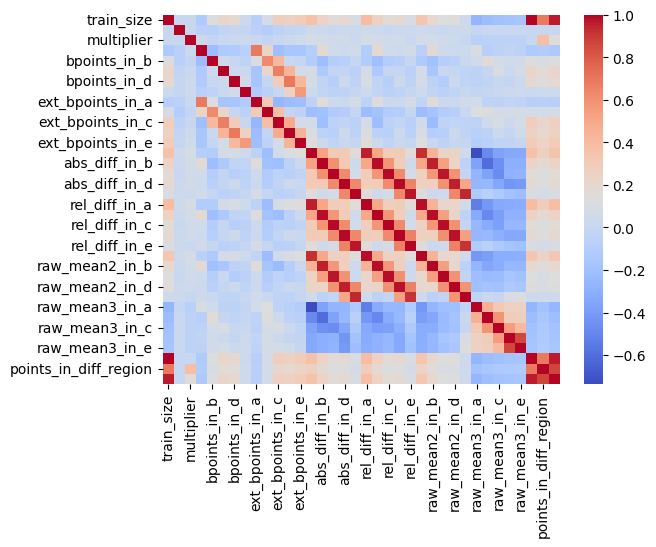

In [12]:
sns.heatmap(df.corr(numeric_only=True), cmap="coolwarm")

In [13]:
df.columns

Index(['train_size', 'random_seed', 'multiplier', 'region', 'bpoints_in_a',
       'bpoints_in_b', 'bpoints_in_c', 'bpoints_in_d', 'bpoints_in_e',
       'ext_bpoints_in_a', 'ext_bpoints_in_b', 'ext_bpoints_in_c',
       'ext_bpoints_in_d', 'ext_bpoints_in_e', 'abs_diff_in_a',
       'abs_diff_in_b', 'abs_diff_in_c', 'abs_diff_in_d', 'abs_diff_in_e',
       'rel_diff_in_a', 'rel_diff_in_b', 'rel_diff_in_c', 'rel_diff_in_d',
       'rel_diff_in_e', 'raw_mean2_in_a', 'raw_mean2_in_b', 'raw_mean2_in_c',
       'raw_mean2_in_d', 'raw_mean2_in_e', 'raw_mean3_in_a', 'raw_mean3_in_b',
       'raw_mean3_in_c', 'raw_mean3_in_d', 'raw_mean3_in_e',
       'points_in_equal_regions', 'points_in_diff_region', 'total_points'],
      dtype='object')

## Joonistame!

### train_size, total_points, multiplier, region, points_in_equal_regions, points_in_diff_region

### bpoints_in, ext_bpoints_in, abs_diff_in, rel_diff_in, raw_mean2, raw_mean3

In [14]:
# OLULINE: BACKUP ONLY
big_df = df.copy()
# võtame keskmise üle meie kolme suure parameetri (keskmistame random seedid välja pmst)
# df = df.groupby(['region', 'multiplier', 'train_size']).mean().reset_index()

In [15]:
df = big_df.groupby(['region', 'multiplier', 'train_size']).mean().reset_index()

In [16]:
df.head()

,region,multiplier,train_size,random_seed,bpoints_in_a,bpoints_in_b,bpoints_in_c,bpoints_in_d,bpoints_in_e,ext_bpoints_in_a,...,raw_mean2_in_d,raw_mean2_in_e,raw_mean3_in_a,raw_mean3_in_b,raw_mean3_in_c,raw_mean3_in_d,raw_mean3_in_e,points_in_equal_regions,points_in_diff_region,total_points
0,A,0.25,10,24.5,9.02,6.56,1.80,0.60,0.34,19.14,...,1.693667,2.698597,0.836516,1.165418,1.697677,2.349689,3.255973,2.0,0.0,8.0
1,A,0.25,20,24.5,7.00,5.98,1.20,0.78,0.10,15.20,...,1.811772,2.440420,0.626474,1.106950,1.631098,2.187996,2.880204,4.0,1.0,17.0
2,A,0.25,30,24.5,7.98,5.44,1.28,0.50,0.08,15.94,...,2.014778,2.775127,0.585256,1.052865,1.593713,2.179384,2.819993,6.0,1.0,25.0
3,A,0.25,40,24.5,8.48,4.68,1.44,0.46,0.10,16.46,...,2.051825,2.630463,0.553760,1.023337,1.568460,2.156222,2.795254,8.0,2.0,34.0
4,A,0.25,50,24.5,9.82,3.72,1.00,0.38,0.08,17.74,...,2.053050,2.692911,0.563397,1.017306,1.591286,2.186870,2.838835,10.0,2.0,42.0


<AxesSubplot: xlabel='total_points', ylabel='Count'>

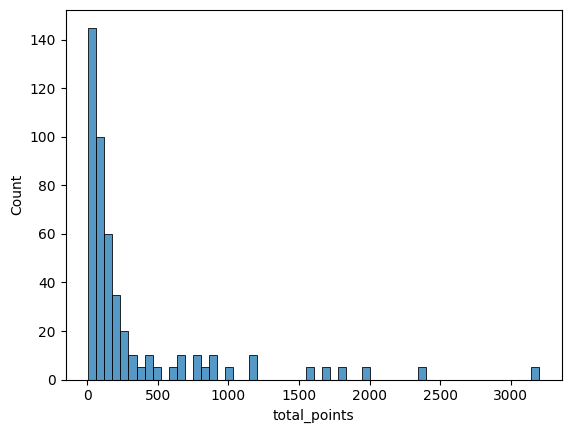

In [17]:
sns.histplot(data=df, x ="total_points",)

<AxesSubplot: xlabel='abs_diff_in_a', ylabel='raw_mean3_in_a'>

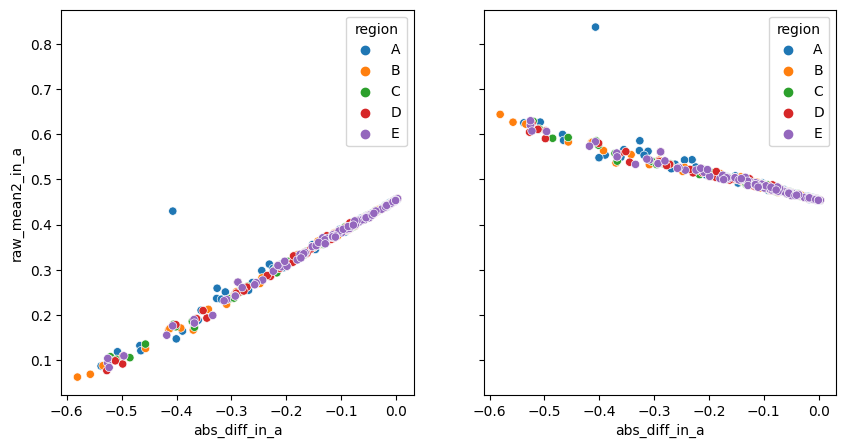

In [18]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
x = 10
sns.scatterplot(ax=ax[0], data=df, x="abs_diff_in_a",y="raw_mean2_in_a", hue="region",) #size="multiplier", sizes=(1*x, 5*x))
sns.scatterplot(ax=ax[1], data=df, x="abs_diff_in_a",y="raw_mean3_in_a", hue="region", )#size="multiplier", sizes=(1*x, 5*x))

Text(0.5, 1.0, 'Kui muudatused on ainult A piirkonnas, kuidas siis muutuvad abs ja rel teistes piirkondades')

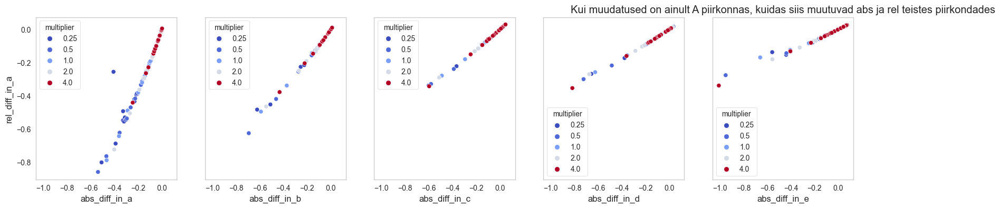

In [25]:
fig, ax = plt.subplots(1, 5, figsize=(20, 4), sharex=True, sharey=True)

sns.scatterplot(ax=ax[0], data=df[df['region'] == 'A'], x="abs_diff_in_a", y="rel_diff_in_a", hue="multiplier", palette="coolwarm")
sns.scatterplot(ax=ax[1], data=df[df['region'] == 'A'], x="abs_diff_in_b", y="rel_diff_in_b", hue="multiplier", palette="coolwarm")
sns.scatterplot(ax=ax[2], data=df[df['region'] == 'A'], x="abs_diff_in_c", y="rel_diff_in_c", hue="multiplier", palette="coolwarm")
sns.scatterplot(ax=ax[3], data=df[df['region'] == 'A'], x="abs_diff_in_d", y="rel_diff_in_d", hue="multiplier", palette="coolwarm")
sns.scatterplot(ax=ax[4], data=df[df['region'] == 'A'], x="abs_diff_in_e", y="rel_diff_in_e", hue="multiplier", palette="coolwarm")
[a.grid() for a in ax]
plt.title("Kui muudatused on ainult A piirkonnas, kuidas siis muutuvad abs ja rel teistes piirkondades")

In [20]:
sns.set_palette("viridis")
plt.style.use('ggplot')
plt.rcParams["image.cmap"] = "viridis"
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=plt.cm.viridis(np.linspace(0, 1, 5)))

<AxesSubplot: xlabel='abs_diff_in_e', ylabel='points_in_equal_regions'>

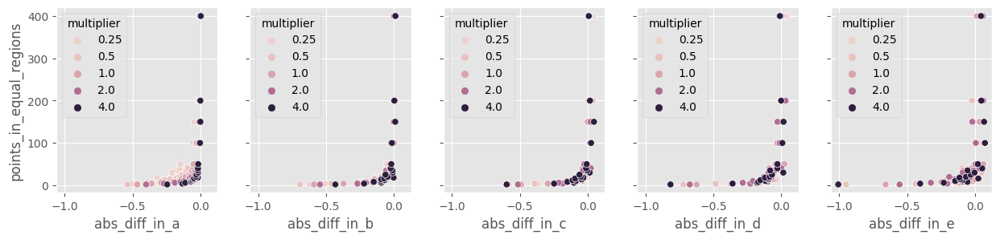

In [21]:
fig, ax = plt.subplots(1, 5, figsize=(15, 3), sharex=True, sharey=True)

# ax[0].set_xscale("log")

sns.scatterplot(ax=ax[0], data=df[df['region'] == 'A'], x="abs_diff_in_a", y="points_in_equal_regions", hue="multiplier", )
sns.scatterplot(ax=ax[1], data=df[df['region'] == 'A'], x="abs_diff_in_b", y="points_in_equal_regions", hue="multiplier", )
sns.scatterplot(ax=ax[2], data=df[df['region'] == 'A'], x="abs_diff_in_c", y="points_in_equal_regions", hue="multiplier", )
sns.scatterplot(ax=ax[3], data=df[df['region'] == 'A'], x="abs_diff_in_d", y="points_in_equal_regions", hue="multiplier", )
sns.scatterplot(ax=ax[4], data=df[df['region'] == 'A'], x="abs_diff_in_e", y="points_in_equal_regions", hue="multiplier", )
#plt.title("Kui muudatused on ainult A piirkonnas, kuidas siis muutuvad abs ja rel teistes piirkondades")

<AxesSubplot: xlabel='abs_diff_in_e', ylabel='points_in_equal_regions'>

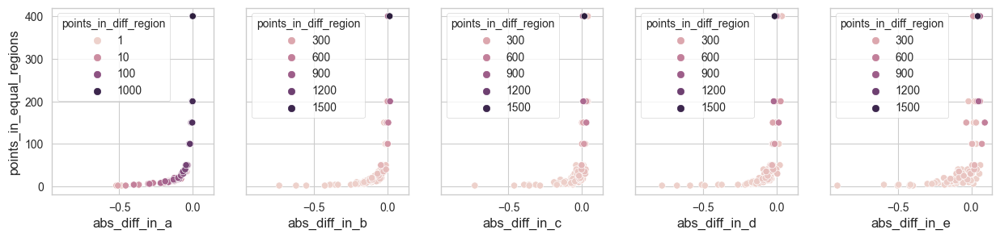

In [39]:
fig, ax = plt.subplots(1, 5, figsize=(15, 3), sharex=True, sharey=True,)

# ax[0].set_xscale("log")

sns.scatterplot(ax=ax[0], data=df[(df['region'] == 'C')&(df['points_in_diff_region']!=0)], x="abs_diff_in_a", y="points_in_equal_regions", hue="points_in_diff_region", hue_norm=LogNorm())
sns.scatterplot(ax=ax[1], data=df[(df['region'] == 'C')&(df['points_in_diff_region']!=0)], x="abs_diff_in_b", y="points_in_equal_regions", hue="points_in_diff_region", )
sns.scatterplot(ax=ax[2], data=df[(df['region'] == 'C')&(df['points_in_diff_region']!=0)], x="abs_diff_in_c", y="points_in_equal_regions", hue="points_in_diff_region", )
sns.scatterplot(ax=ax[3], data=df[(df['region'] == 'C')&(df['points_in_diff_region']!=0)], x="abs_diff_in_d", y="points_in_equal_regions", hue="points_in_diff_region", )
sns.scatterplot(ax=ax[4], data=df[(df['region'] == 'C')&(df['points_in_diff_region']!=0)], x="abs_diff_in_e", y="points_in_equal_regions", hue="points_in_diff_region", )
#plt.title("Kui muudatused on ainult A piirkonnas, kuidas siis muutuvad abs ja rel teistes piirkondades")

In [23]:
diverging_colors = sns.color_palette("mako", df["total_points"].nunique())
sns.set_palette(diverging_colors)
plt.show()

legend
title
save


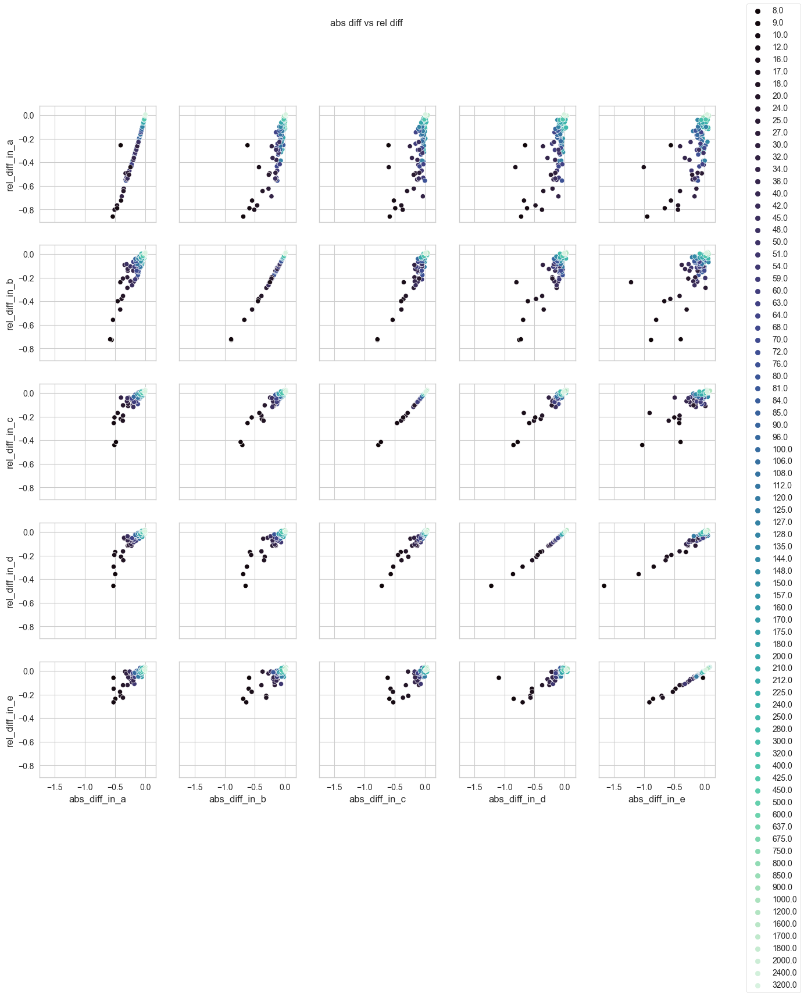

In [40]:
def megaplotty(x_axis_data,x_letter, y_axis_data, y_letter, df, hue='multiplier', title="", save=False):

    fig, ax = plt.subplots(5, 5, figsize=(15, 15), sharex=True, sharey=True)

    # ax[0].set_xscale("log")
    diverging_colors = sns.color_palette("mako", df[hue].nunique())
    sns.set_style("whitegrid")
    for i in range(5):
        for j in range(5):
            if x_letter:
                x = x_axis_data+chr(97+j)
            else:
                x = x_axis_data
            if y_letter:
                y = y_axis_data+chr(97+i)
            else:
                y = y_axis_data
            #print(f"Subplot {i}, {j} saab endale {x} ja {y}, koos region {chr(65+i)}")
            sns.scatterplot(ax=ax[i, j], data=df[df['region'] == chr(65+i)], x=x, y=y, hue=hue, palette=diverging_colors)
            #ax[i, j].set_title(f"abs_diff_in_{chr(97+i)}")
            handles, labels = ax[i,j].get_legend_handles_labels() # võtab legendi ja salvestab ära, tegelikult võib ka lõpus korra teha seda
            ax[i,j].get_legend().remove()   # et iga subplot ei kuvaks sama legendi
    print("legend")
    fig.legend(handles, labels, loc='upper right')
    #plt.legend()

    print("title")
    plt.suptitle(title)

    print("save")
    if save:
        plt.savefig(f"plots/ilusad/{title}.jpeg", dpi=100)

megaplotty('abs_diff_in_',True, 'rel_diff_in_',True ,df, hue='total_points', title="abs diff vs rel diff", save=True)

In [65]:
df.total_points.nunique()

81

legend
title
save


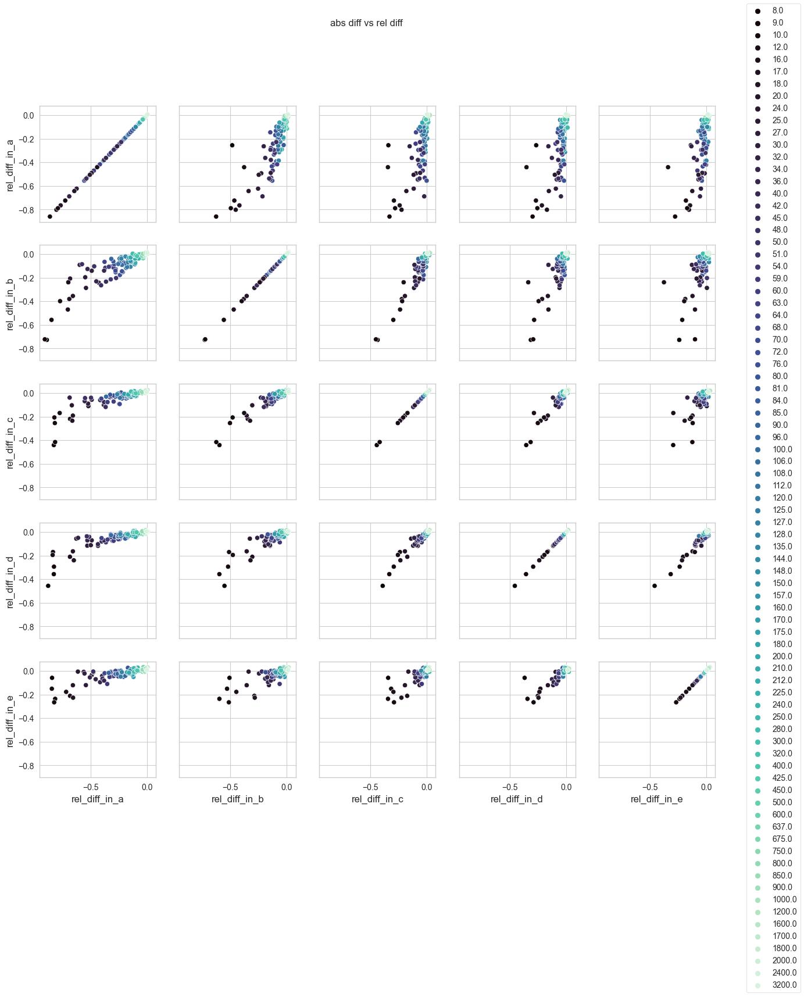

In [64]:
megaplotty('rel_diff_in_',True, 'rel_diff_in_',True ,df, hue='total_points', title="abs diff vs rel diff", save=True)

legend
title
save


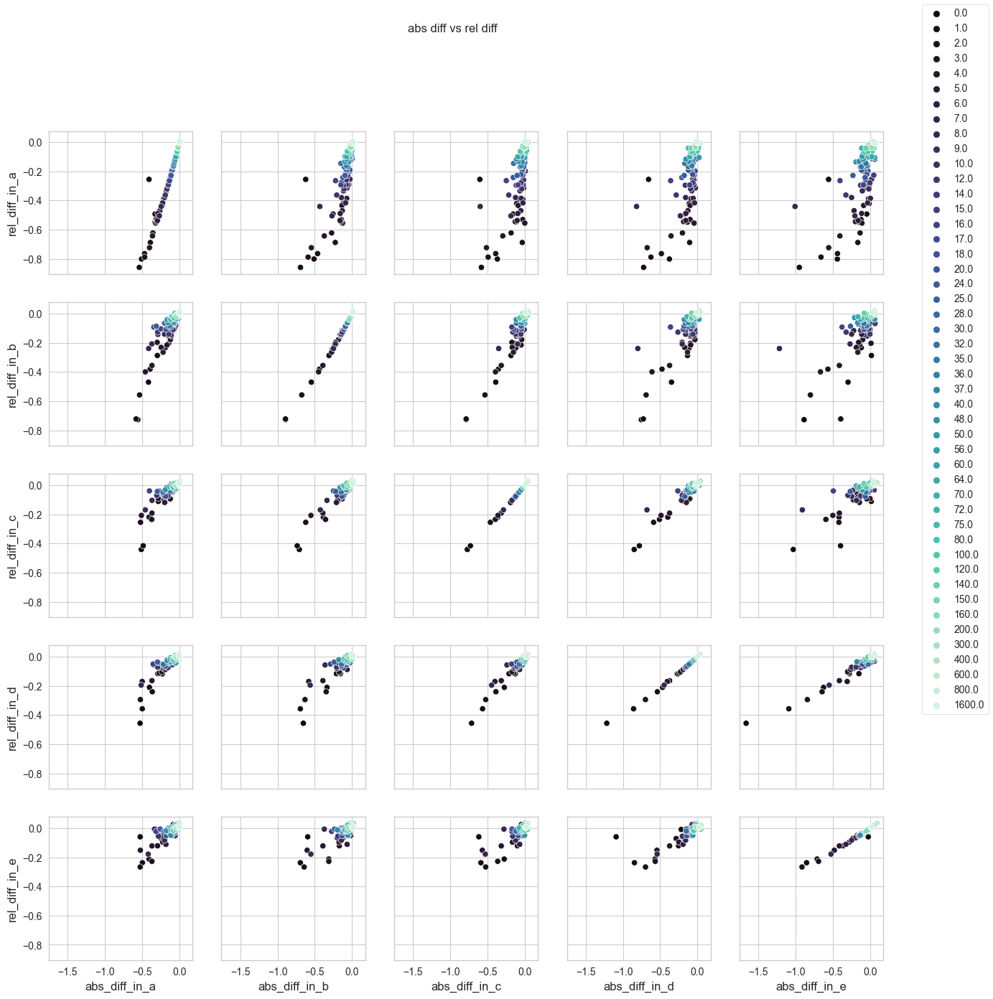

In [41]:
megaplotty('abs_diff_in_',True, 'rel_diff_in_',True ,df, hue='points_in_diff_region', title="abs diff vs rel diff", save=True)

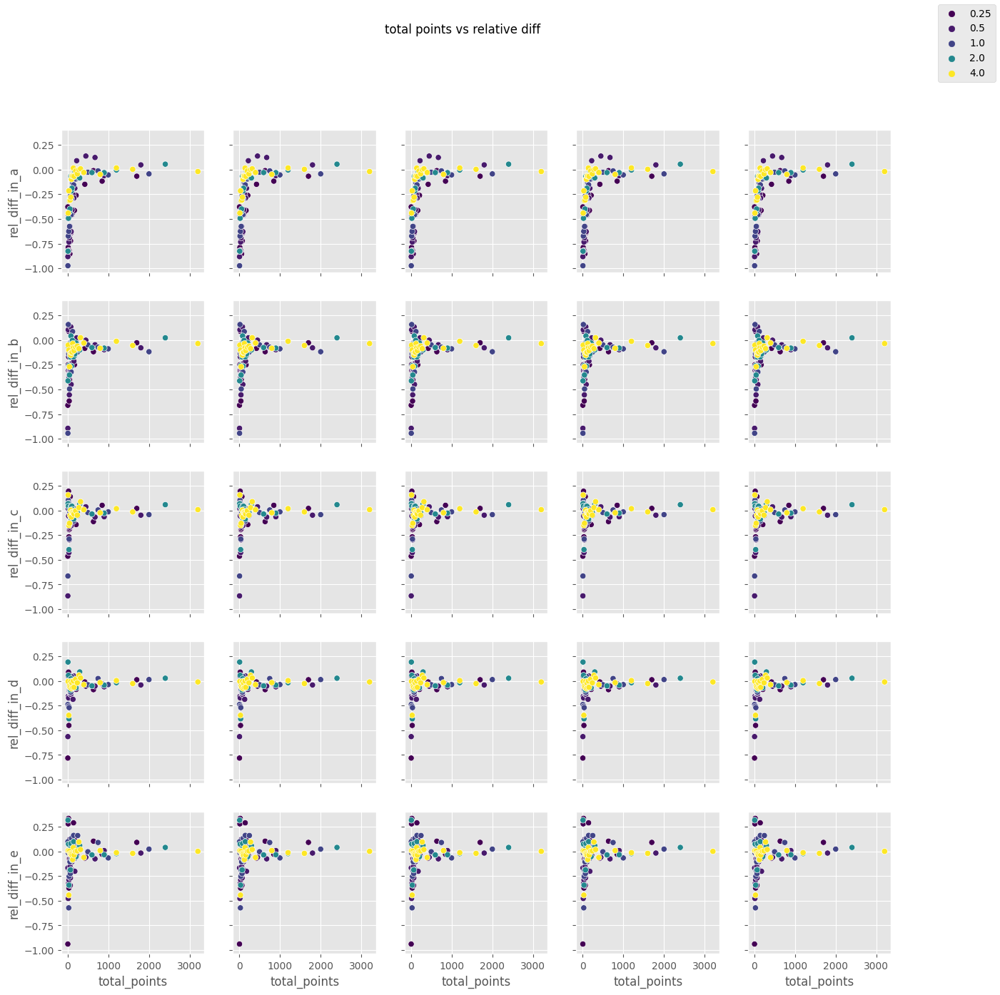

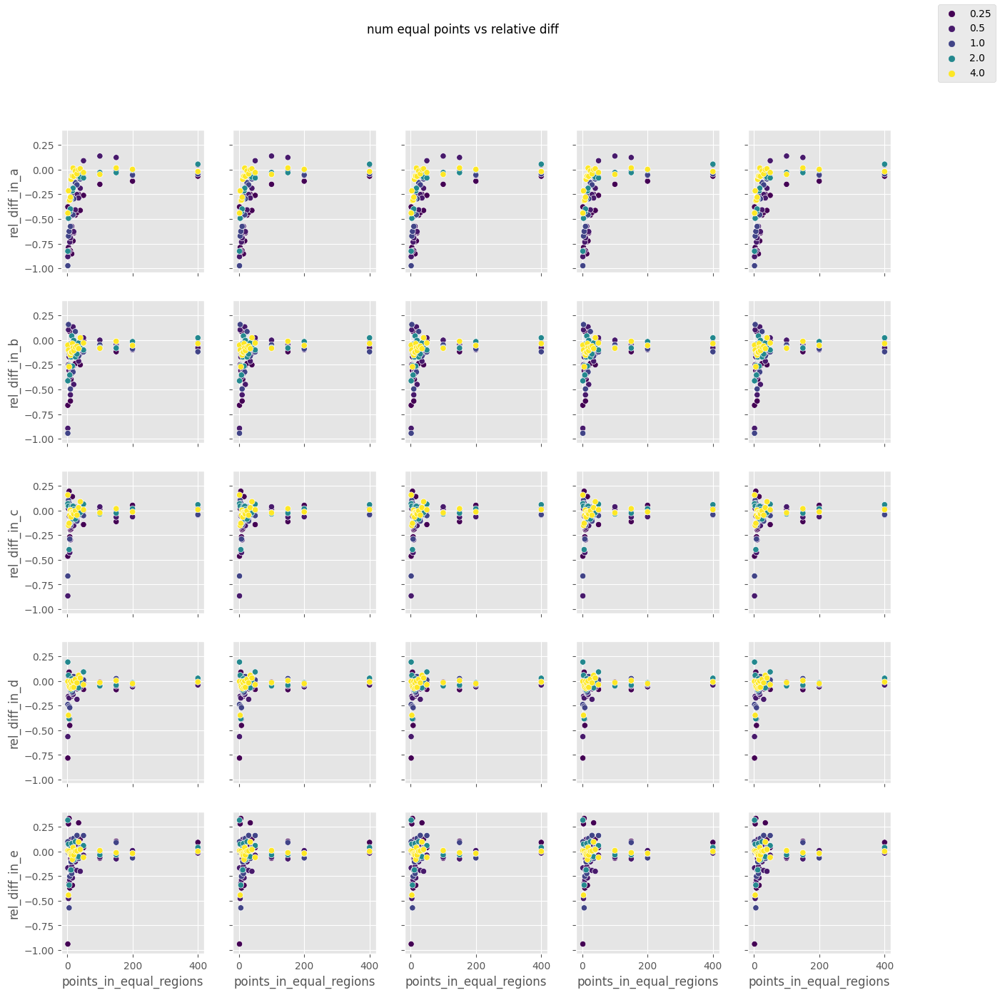

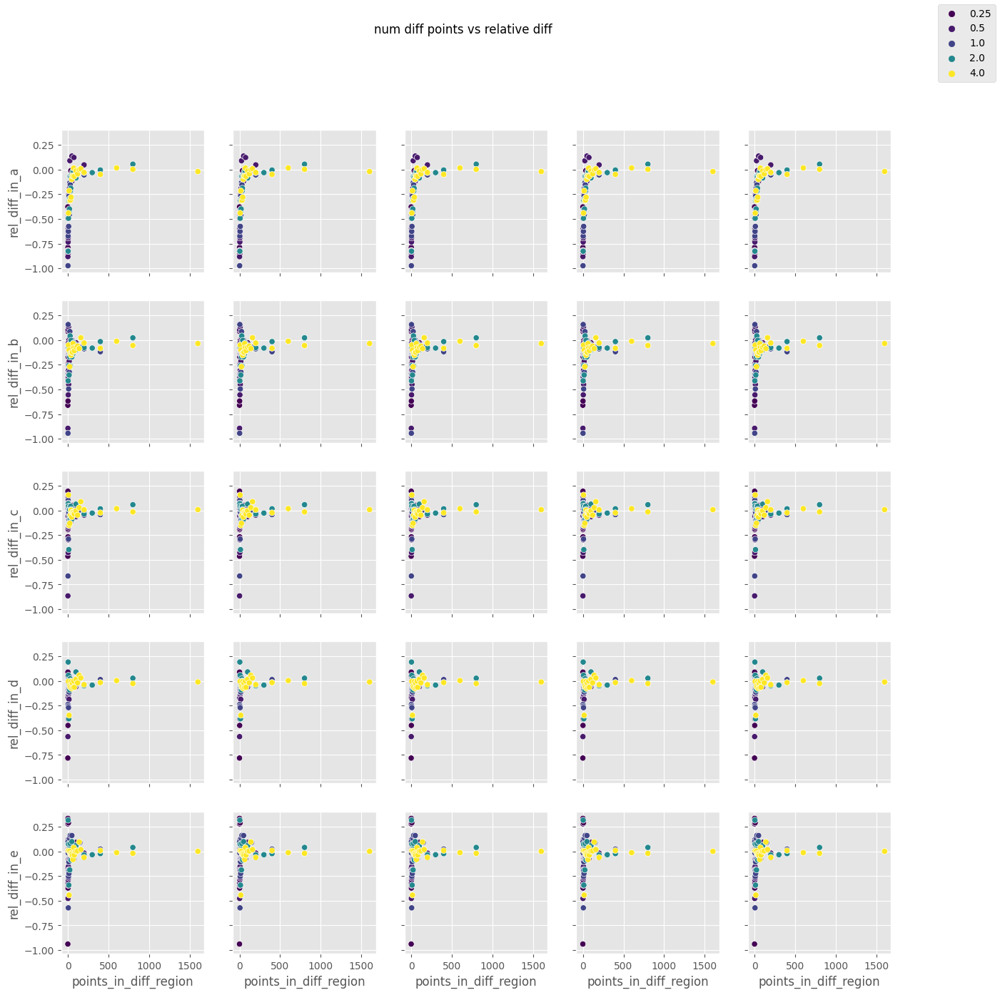

In [ ]:
# megaplotty('total_points',False, 'rel_diff_in_',True ,df, hue='multiplier', title="total points vs relative diff", save=True)
# megaplotty('points_in_equal_regions',False, 'rel_diff_in_',True ,df, hue='multiplier', title="num equal points vs relative diff", save=True)
# megaplotty('points_in_diff_region',False, 'rel_diff_in_',True ,df, hue='multiplier', title="num diff points vs relative diff", save=True)

In [ ]:
# megaplotty('total_points',False, 'abs_diff_in_',True ,df, hue='multiplier', title="total points vs absolute diff", save=True)
# megaplotty('points_in_equal_regions',False, 'abs_diff_in_',True ,df, hue='multiplier', title="num equal points vs absolute diff", save=True)
# megaplotty('points_in_diff_region',False, 'abs_diff_in_',True ,df, hue='multiplier', title="num diff points vs absolute diff", save=True)

KeyboardInterrupt: 

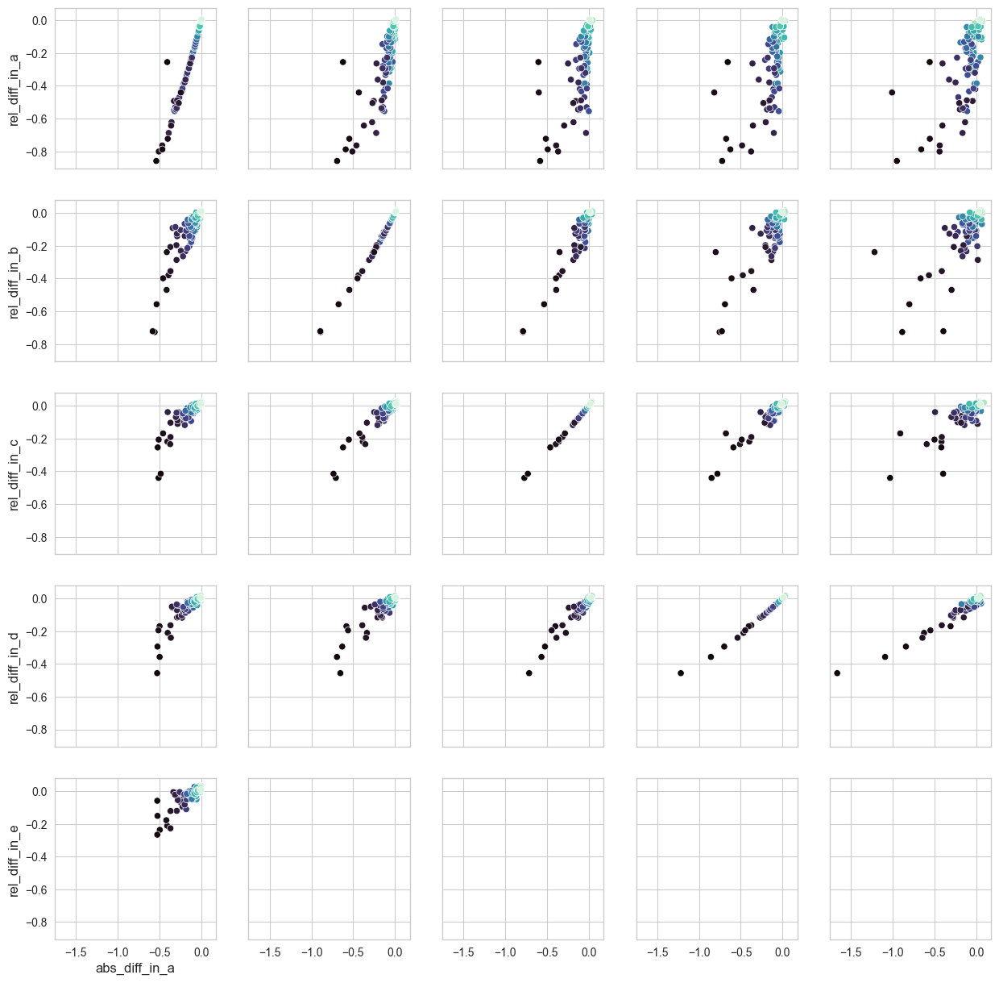

In [42]:
megaplotty('abs_diff_in_',True, 'rel_diff_in_',True ,df, hue='total_points', title="abs diff vs rel diff", save=True)

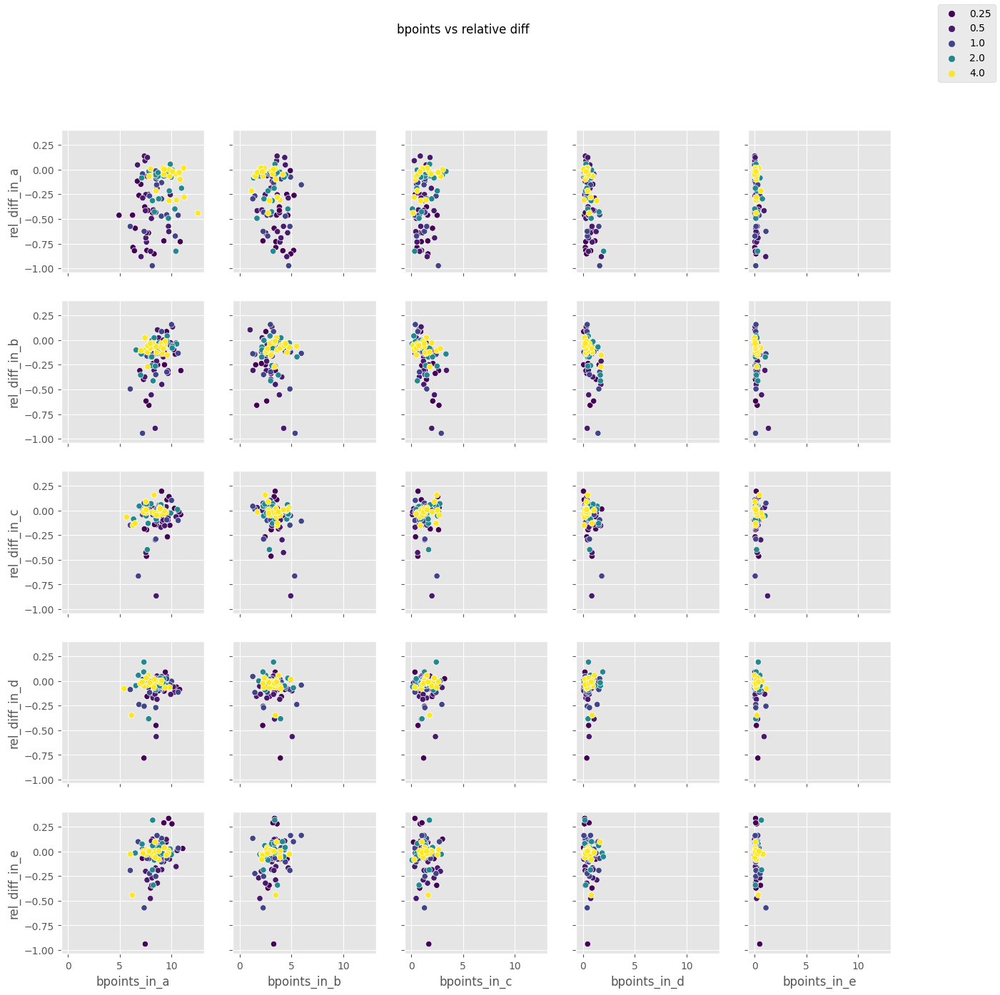

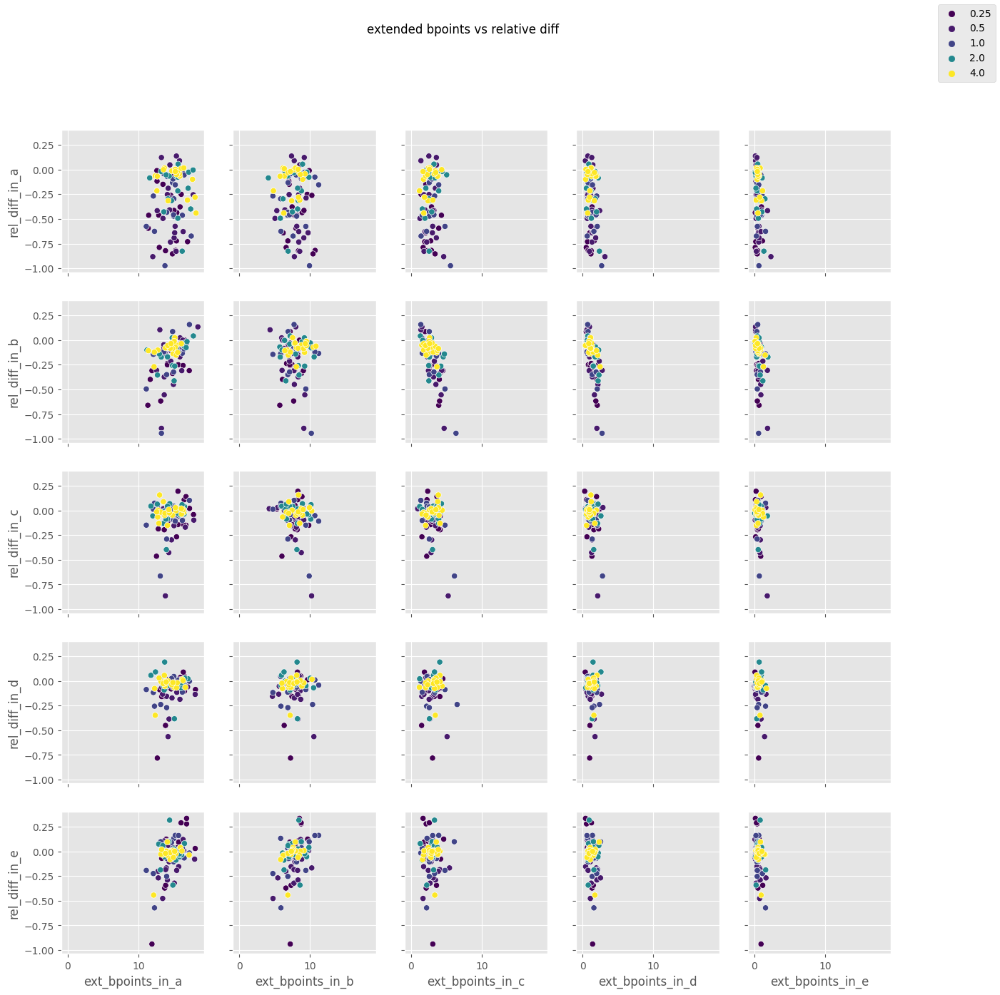

In [ ]:
megaplotty('abs_diff_in_',True, 'rel_diff_in_',True ,df, hue='total_points', title="abs diff vs rel diff", save=True)
# megaplotty('ext_bpoints_in_',True, 'rel_diff_in_',True ,df, hue='multiplier', title="extended bpoints vs relative diff", save=True)

In [43]:
megaplotty('bpoints_in_',True, 'abs_diff_in_',True ,df, hue='multiplier', title="bpoints vs absolute diff", save=True)
megaplotty('ext_bpoints_in_',True, 'abs_diff_in_',True ,df, hue='multiplier', title="extended bpoints vs absolute diff", save=True)

In [ ]:
df.columns

Index(['region', 'multiplier', 'train_size', 'random_seed', 'bpoints_in_a',
       'bpoints_in_b', 'bpoints_in_c', 'bpoints_in_d', 'bpoints_in_e',
       'ext_bpoints_in_a', 'ext_bpoints_in_b', 'ext_bpoints_in_c',
       'ext_bpoints_in_d', 'ext_bpoints_in_e', 'abs_diff_in_a',
       'abs_diff_in_b', 'abs_diff_in_c', 'abs_diff_in_d', 'abs_diff_in_e',
       'rel_diff_in_a', 'rel_diff_in_b', 'rel_diff_in_c', 'rel_diff_in_d',
       'rel_diff_in_e', 'raw_mean2_in_a', 'raw_mean2_in_b', 'raw_mean2_in_c',
       'raw_mean2_in_d', 'raw_mean2_in_e', 'raw_mean3_in_a', 'raw_mean3_in_b',
       'raw_mean3_in_c', 'raw_mean3_in_d', 'raw_mean3_in_e',
       'points_in_equal_regions', 'points_in_diff_region', 'total_points'],
      dtype='object')

In [44]:
df["combo_name"] = df["train_size"].astype(str) + "_" + df["region"] + "_" + df["multiplier"].astype(str)

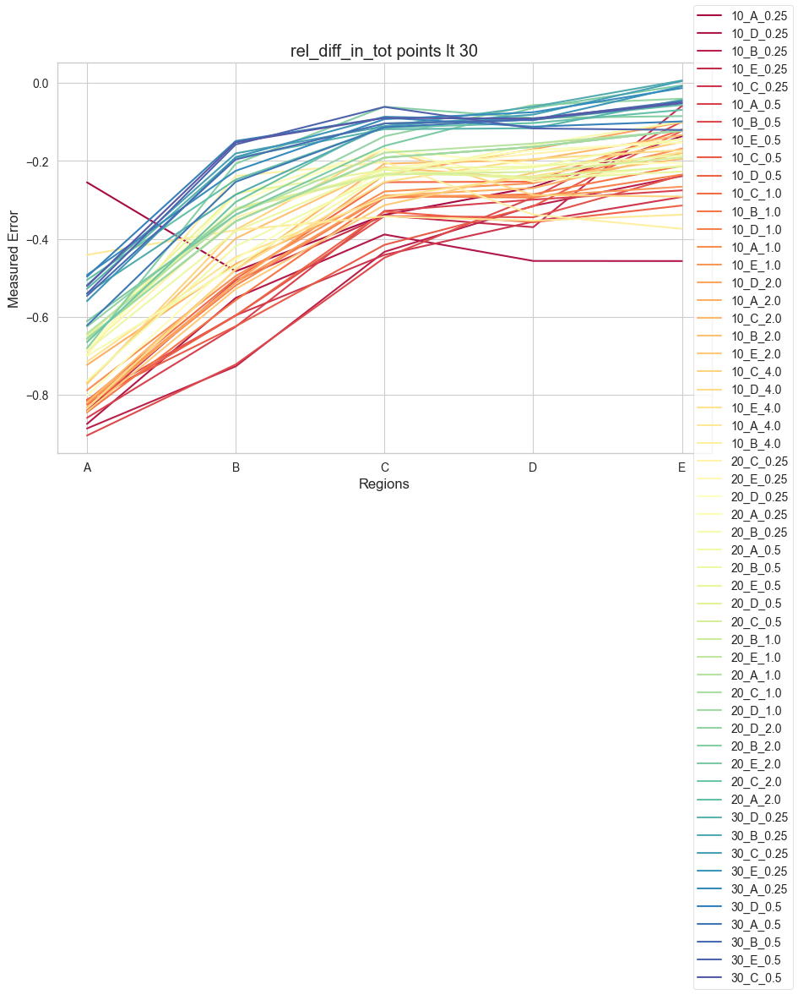

In [47]:
def plotter_2(df, x,title_additional=""):
    regions = ['A', 'B', 'C', 'D', 'E']

    fig, ax = plt.subplots(figsize=(10, 6))
    
    diverging_colors = sns.color_palette("Spectral", df.shape[0])
    # sns.palplot(diverging_colors)

    for i, values in enumerate(df.iterrows()):
        ax.plot(regions, values[1][[*[f"{x}{chr(i+97)}" for i in range(5)]]], label=values[1]["combo_name"], color=diverging_colors[i])
        
        handles, labels = ax.get_legend_handles_labels()

    ax.set_xlabel('Regions')
    ax.set_ylabel('Measured Error')
    ax.set_title(x+title_additional)
    # ax.legend()
    
    fig.legend(handles, labels, loc='upper right')
    
    plt.show()
    fig.savefig(f"plots/ilusad/normal2_lot_of_data/regions_and_{x}_{title_additional}.jpeg", dpi=300)

test_df = df[df["total_points"]<30].sort_values("total_points")
plotter_2(test_df, "rel_diff_in_", "tot points lt 30")

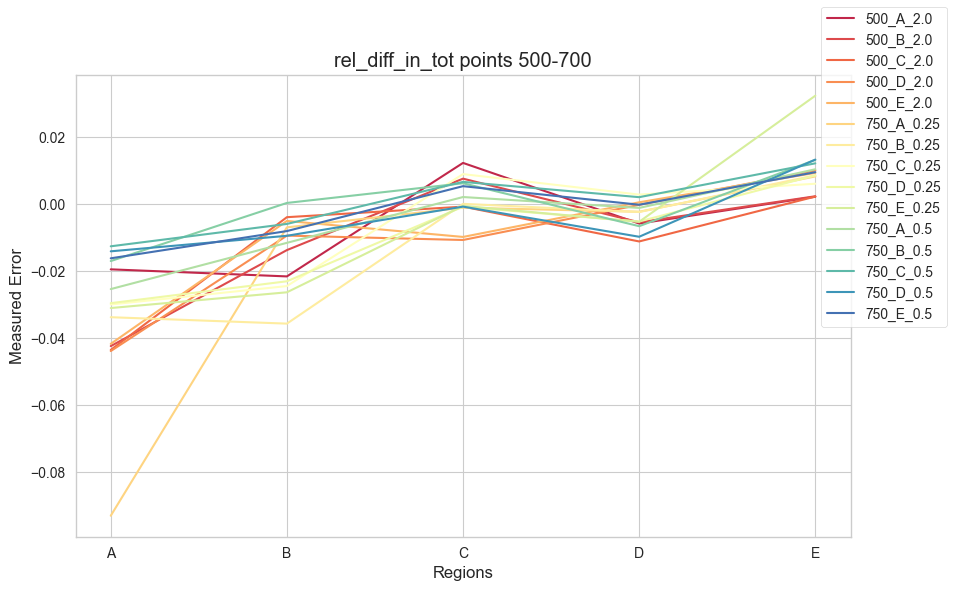

In [48]:
test_df = df[(df["total_points"]>500)&(df["total_points"]<700)].sort_values("total_points")
plotter_2(test_df, "rel_diff_in_", "tot points 500-700")

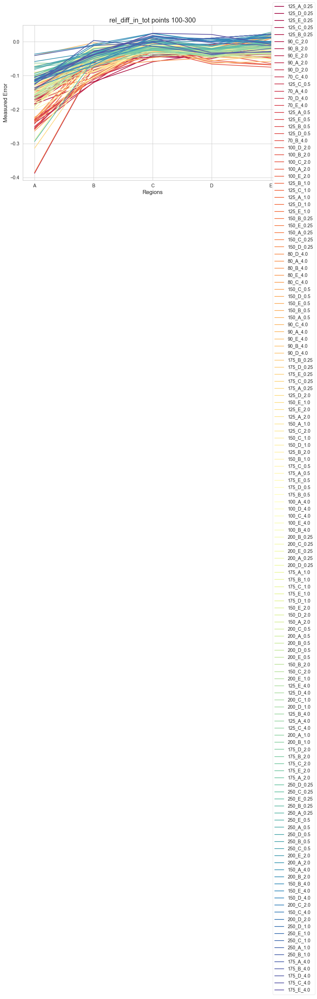

In [49]:
test_df = df[(df["total_points"]>100)&(df["total_points"]<300)].sort_values("total_points")
plotter_2(test_df, "rel_diff_in_", "tot points 100-300")

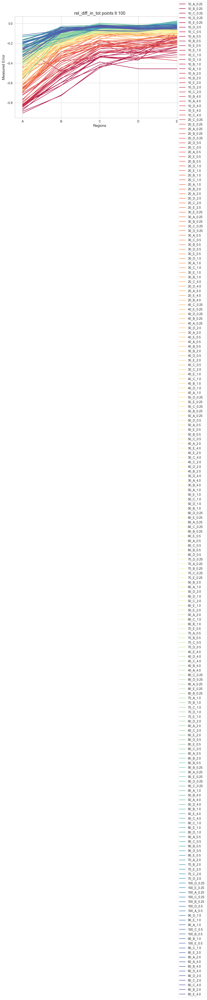

In [50]:
test_df = df[df["total_points"]<100].sort_values("total_points")
plotter_2(test_df, "rel_diff_in_", "tot points lt 100")

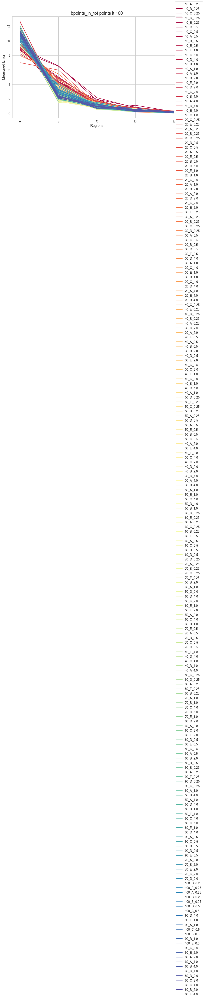

In [51]:
test_df = df[df["total_points"]<100].sort_values("total_points")
plotter_2(test_df, "bpoints_in_", "tot points lt 100")

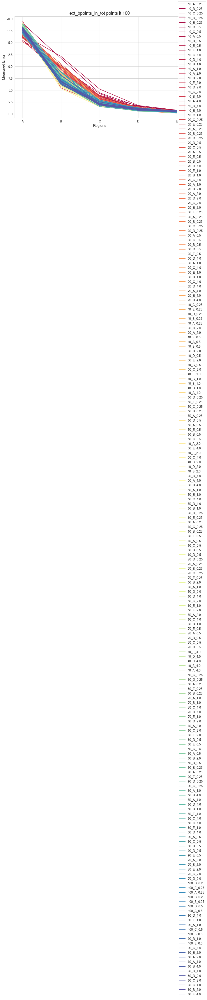

In [52]:
test_df = df[df["total_points"]<100].sort_values("total_points")
plotter_2(test_df, "ext_bpoints_in_", "tot points lt 100")

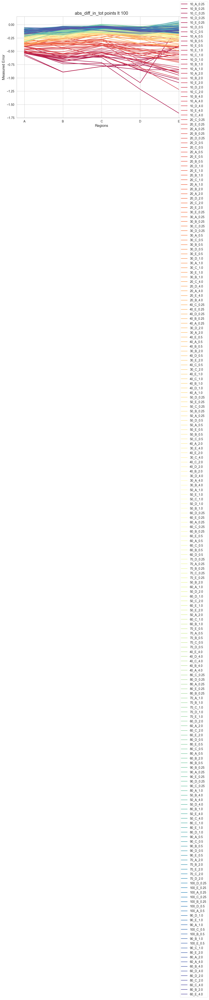

In [53]:
test_df = df[df["total_points"]<100].sort_values("total_points")
plotter_2(test_df, "abs_diff_in_", "tot points lt 100")

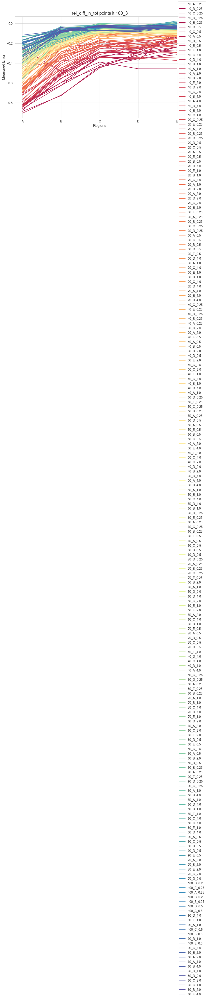

In [54]:
test_df = df[df["total_points"]<100].sort_values("total_points")
plotter_2(test_df, "rel_diff_in_", "tot points lt 100_3")

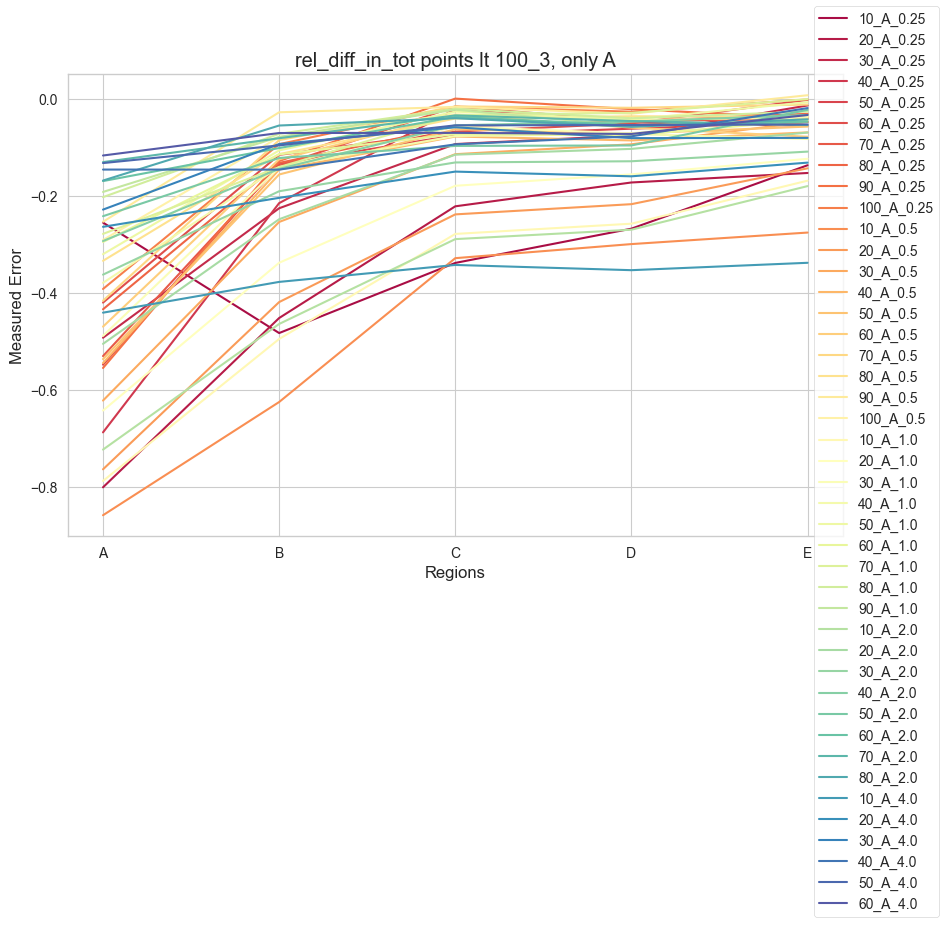

In [55]:
test_df = df[(df["total_points"]<100)&(df["region"]=="A")].sort_values(["multiplier","total_points"])
plotter_2(test_df, "rel_diff_in_", "tot points lt 100_3, only A")

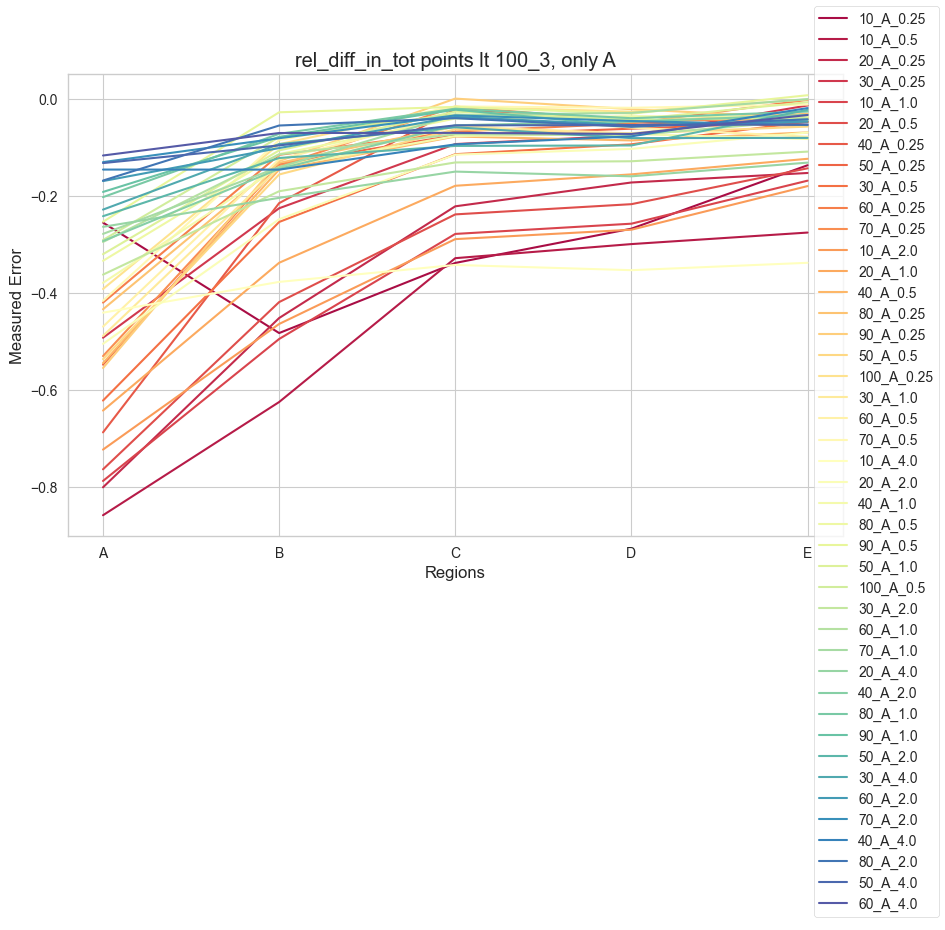

In [56]:
test_df = df[(df["total_points"]<100)&(df["region"]=="A")].sort_values(["points_in_diff_region", "total_points"])
plotter_2(test_df, "rel_diff_in_", "tot points lt 100_3, only A")

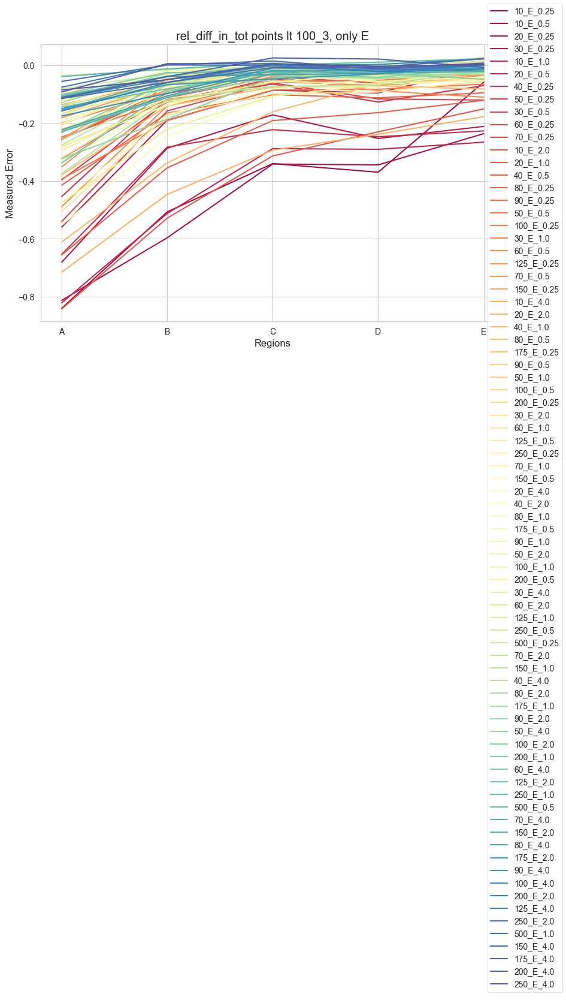

In [57]:
test_df = df[(df["total_points"]<600)&(df["region"]=="E")].sort_values(["points_in_diff_region", "total_points"])
plotter_2(test_df, "rel_diff_in_", "tot points lt 100_3, only E")

In [ ]:
test_df[["combo_name", "points_in_diff_region", "total_points"]].tail(20)

,combo_name,points_in_diff_region,total_points
256,100_C_2.0,40.0,120.0
241,200_C_1.0,40.0,200.0
271,60_C_4.0,48.0,96.0
257,125_C_2.0,50.0,150.0
242,250_C_1.0,50.0,250.0
224,500_C_0.5,50.0,450.0
272,70_C_4.0,56.0,112.0
258,150_C_2.0,60.0,180.0
273,80_C_4.0,64.0,128.0
259,175_C_2.0,70.0,210.0


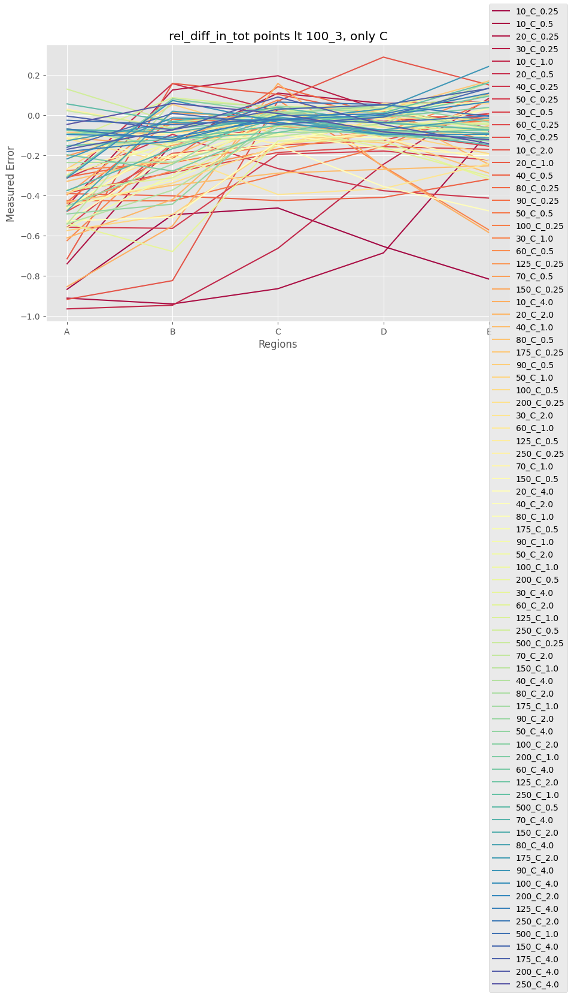

In [ ]:
test_df = df[(df["total_points"]<600)&(df["region"]=="C")].sort_values(["points_in_diff_region", "total_points"])
plotter_2(test_df, "rel_diff_in_", "tot points lt 100_3, only C")

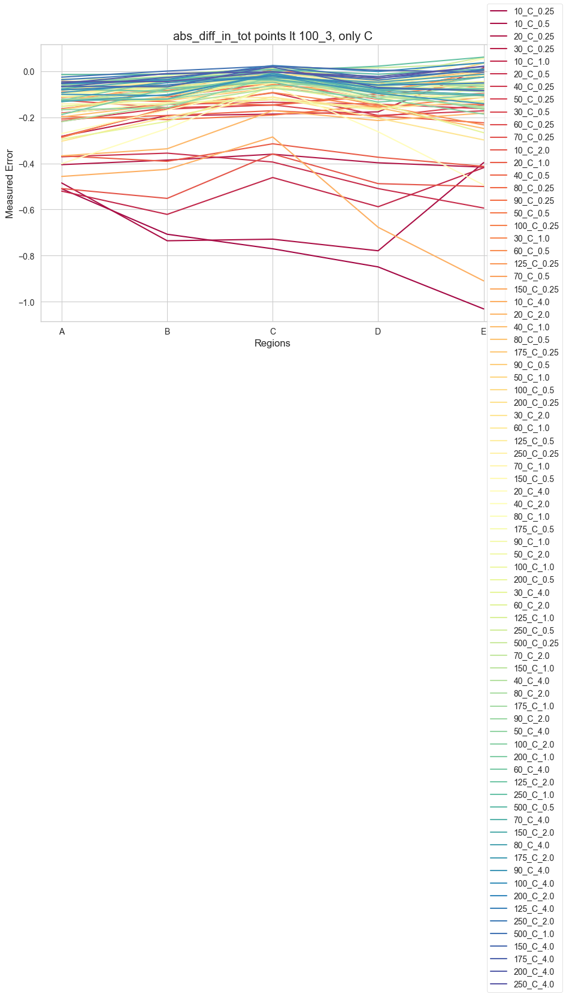

In [58]:
test_df = df[(df["total_points"]<600)&(df["region"]=="C")].sort_values(["points_in_diff_region", "total_points"])
plotter_2(test_df, "abs_diff_in_", "tot points lt 100_3, only C")

In [59]:
def plotter_3(df, y,title_additional=""):
    regions = ['A', 'B', 'C', 'D', 'E']

    fig, ax = plt.subplots(figsize=(10, 6))
    
    diverging_colors = sns.color_palette("Spectral", df.shape[0])
    # sns.palplot(diverging_colors)
    sns.scatterplot(data = df, x="points_in_diff_region_dummy",y=y )
    # for i, values in enumerate(df.iterrows()):
    #     ax.plot(values[1]["points_in_diff_region"], values[1]["abs_diff_in_c"], label=values[1]["combo_name"], color=diverging_colors[i])
        
    #     handles, labels = ax.get_legend_handles_labels()

    # ax.set_xlabel('Regions')
    # ax.set_ylabel('Measured Error')
    # ax.set_title(x+title_additional)
    # # ax.legend()
    
    
    # fig.legend(handles, labels, loc='upper right')
    
    plt.show()
    #fig.savefig(f"plots/ilusad/regions_and_{x}_{title_additional}.jpeg", dpi=300)

#test_df = df[df["total_points"]<600].sort_values("total_points")
#plotter_3(test_df, "abs_diff_in_", "asdf")

In [ ]:
round(123, -1)

120

In [ ]:
df[(df["points_in_diff_region"]>105)& (df["points_in_diff_region"]<180)&(df['region']=="C")].sort_values("points_in_diff_region")

,region,multiplier,train_size,random_seed,bpoints_in_a,bpoints_in_b,bpoints_in_c,bpoints_in_d,bpoints_in_e,ext_bpoints_in_a,...,raw_mean2_in_e,raw_mean3_in_a,raw_mean3_in_b,raw_mean3_in_c,raw_mean3_in_d,raw_mean3_in_e,points_in_equal_regions,points_in_diff_region,total_points,combo_name
277,C,4.0,150,24.5,8.56,3.92,1.12,0.42,0.22,14.82,...,3.045953,0.467185,1.000175,1.519249,2.108321,2.689146,30.0,120.0,240.0,150_C_4.0
278,C,4.0,175,24.5,8.86,4.76,1.54,0.28,0.14,15.26,...,3.054053,0.483375,1.011925,1.513662,2.106643,2.700308,35.0,140.0,280.0,175_C_4.0
244,C,1.0,750,24.5,8.48,3.12,1.18,0.40,0.04,14.68,...,2.910404,0.449261,0.996526,1.514778,2.102220,2.670984,150.0,150.0,750.0,750_C_1.0
279,C,4.0,200,24.5,7.54,2.76,2.24,0.36,0.06,13.54,...,2.330103,0.462557,1.011292,1.518240,2.116397,2.719278,40.0,160.0,320.0,200_C_4.0


In [ ]:
test_df = df.copy()
test_df = test_df[(test_df["region"]=="C")&(test_df["multiplier"]==4.0)]
test_df["points_in_diff_region_dummy"] = test_df["points_in_diff_region"].apply(lambda x: round(x/30,0)*30 )
test_df.value_counts("points_in_diff_region_dummy", sort=False)

points_in_diff_region_dummy
0.0       1
30.0      4
60.0      4
90.0      2
120.0     1
150.0     2
210.0     1
390.0     1
600.0     1
810.0     1
1590.0    1
dtype: int64

C:\Users\troosma\AppData\Local\Temp\ipykernel_4592\78514791.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  test_df = test_df[(test_df["region"]==letter)&(test_df["multiplier"]==2)].groupby(["points_in_diff_region_dummy"]).mean().reset_index()


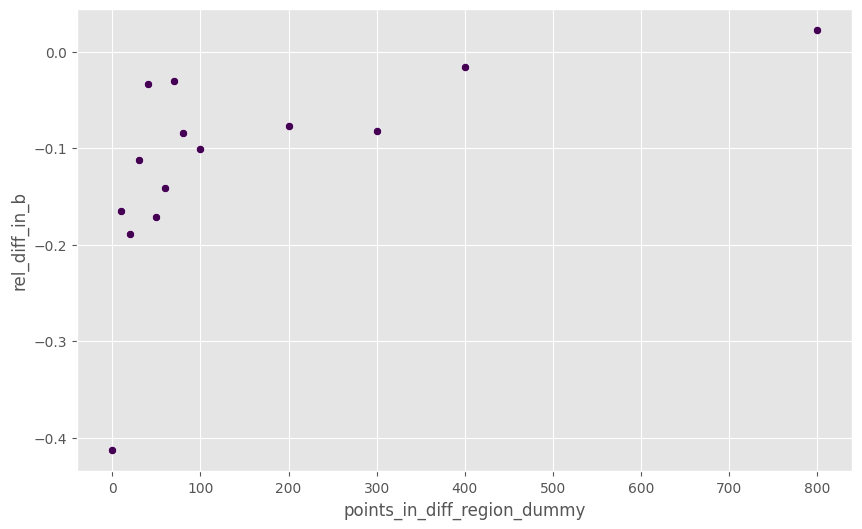

In [ ]:
#test_df = df.copy()
letter = "B"
#test_df["points_in_diff_region_dummy"] = test_df["points_in_diff_region"].apply(lambda x: round(x/10,0)*10 )
test_df = test_df[(test_df["region"]==letter)&(test_df["multiplier"]==2)].groupby(["points_in_diff_region_dummy"]).mean().reset_index()
plotter_3(test_df, "rel_diff_in_"+letter.lower(), "asdf")

C:\Users\troosma\AppData\Local\Temp\ipykernel_24072\3787028960.py:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  test_df = test_df[(test_df["region"]==letter)&(test_df["multiplier"]==2)].groupby(["points_in_diff_region_dummy"]).mean().reset_index()
C:\Users\troosma\AppData\Local\Temp\ipykernel_24072\3787028960.py:9: UserWarning: The palette list has more values (37) than needed (19), which may not be intended.
  sns.scatterplot(data = df, x="points_in_diff_region",y=y, hue="points_in_equal_regions",markers="multiplier", palette=diverging_colors )


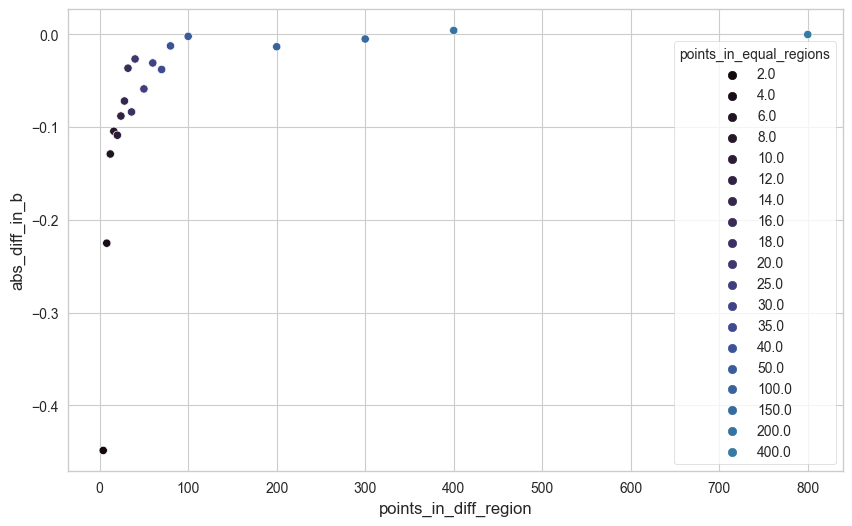

In [63]:
def plotter_4(df, y,title_additional=""):
    regions = ['A', 'B', 'C', 'D', 'E']

    fig, ax = plt.subplots(figsize=(10, 6))
    
    diverging_colors = sns.color_palette("mako", df.shape[1])
    # plt.yscale('function', functions=(lambda y: 1/(y+1), lambda y: 1/(y+1)))

    sns.scatterplot(data = df, x="points_in_diff_region",y=y, hue="points_in_equal_regions",markers="multiplier", palette=diverging_colors )

    plt.show()


letter = "B"
test_df = df.copy()
test_df["points_in_diff_region_dummy"] = test_df["points_in_diff_region"].apply(lambda x: round(x/1,0)*1)
test_df = test_df[(test_df["region"]==letter)&(test_df["multiplier"]==2)].groupby(["points_in_diff_region_dummy"]).mean().reset_index()

plotter_4(test_df, "abs_diff_in_"+letter.lower(), "asdf")

In [ ]:
df2 = pd.read_csv("andmed\\normal_const.csv")

In [ ]:
df2 = df2[df2.random_seed < 50] # ma ei tea kust suuremad sisse kargasid
df2.train_size = df2.train_size.astype(int)
df2.random_seed = df2.random_seed.astype(int)
df2.multiplier = df2.multiplier.astype(float)
for i in range(5):
    df2[f"ext_bpoints_in_{chr(i+ord('a'))}"] = df2[f"ext_bpoints_in_{chr(i+ord('a'))}"].astype(int)

# lisame mugavusväärtused
df2["points_in_equal_regions"] = (df2["train_size"] / 5).astype(int)
df2["points_in_diff_region"] =  (df2["points_in_equal_regions"] * df2["multiplier"]).astype(int)
df2["total_points"] = 4*df2["points_in_equal_regions"] + df2["points_in_diff_region"]

C:\Users\troosma\AppData\Local\Temp\ipykernel_1336\3905602337.py:19: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  test_df = test_df[(test_df["region"]==letter)&(test_df["multiplier"]==2)].groupby(["points_in_diff_region_dummy"]).mean().reset_index()
C:\Users\troosma\AppData\Local\Temp\ipykernel_1336\3905602337.py:10: UserWarning: The palette list has more values (37) than needed (19), which may not be intended.
  sns.scatterplot(data = df, x="points_in_diff_region",y=y, hue="points_in_diff_region",markers="multiplier", palette=diverging_colors )


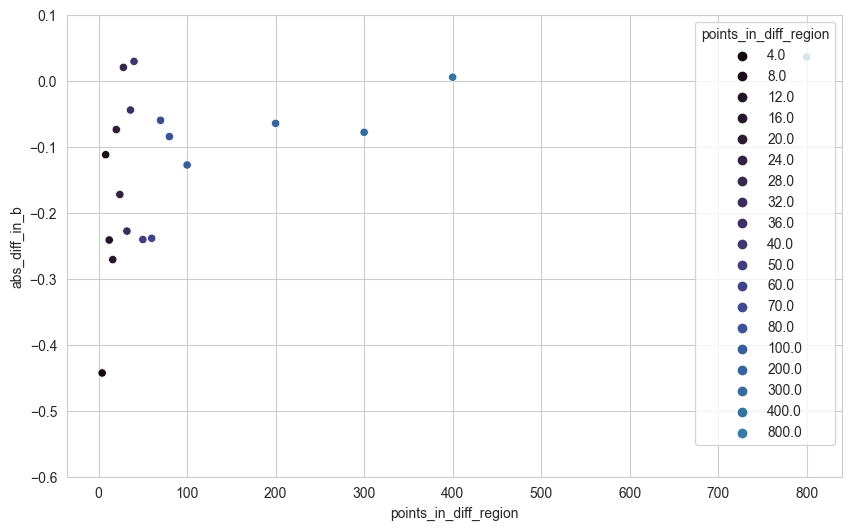

C:\Users\troosma\AppData\Local\Temp\ipykernel_1336\3905602337.py:25: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  test_df = test_df[(test_df["region"]==letter)&(test_df["multiplier"]==2)].groupby(["points_in_diff_region_dummy"]).mean().reset_index()
C:\Users\troosma\AppData\Local\Temp\ipykernel_1336\3905602337.py:10: UserWarning: The palette list has more values (37) than needed (19), which may not be intended.
  sns.scatterplot(data = df, x="points_in_diff_region",y=y, hue="points_in_diff_region",markers="multiplier", palette=diverging_colors )


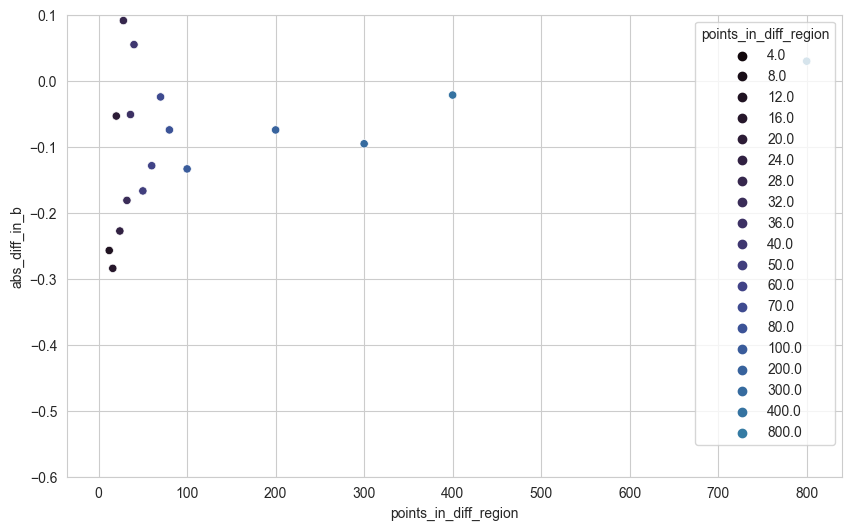

In [ ]:
def plotter_4(df, y,title_additional=""):
    regions = ['A', 'B', 'C', 'D', 'E']

    fig, ax = plt.subplots(figsize=(10, 6))
    
    diverging_colors = sns.color_palette("mako", df.shape[1])
    # plt.yscale('function', functions=(lambda y: 1/(y+1), lambda y: 1/(y+1)))
    ax.set_ylim(-0.6, 0.1)

    sns.scatterplot(data = df, x="points_in_diff_region",y=y, hue="points_in_diff_region",markers="multiplier", palette=diverging_colors )

    plt.show()


letter = "B"
test_df = df2.copy()
test_df = test_df[test_df["random_seed"].isin([2])]
test_df["points_in_diff_region_dummy"] = test_df["points_in_diff_region"].apply(lambda x: round(x/2,0)*2)
test_df = test_df[(test_df["region"]==letter)&(test_df["multiplier"]==2)].groupby(["points_in_diff_region_dummy"]).mean().reset_index()

plotter_4(test_df, "abs_diff_in_"+letter.lower(), "asdf")
test_df = df2.copy()
test_df = test_df[test_df["random_seed"].isin([3])]
test_df["points_in_diff_region_dummy"] = test_df["points_in_diff_region"].apply(lambda x: round(x/2,0)*2)
test_df = test_df[(test_df["region"]==letter)&(test_df["multiplier"]==2)].groupby(["points_in_diff_region_dummy"]).mean().reset_index()

plotter_4(test_df, "abs_diff_in_"+letter.lower(), "asdf")


In [ ]:
df.sort_values(by=["train_size", "region", "multiplier", "random_seed"], inplace=True, ignore_index=True)

In [ ]:
megaplotty(df, "abs_diff_in_", "asdf")

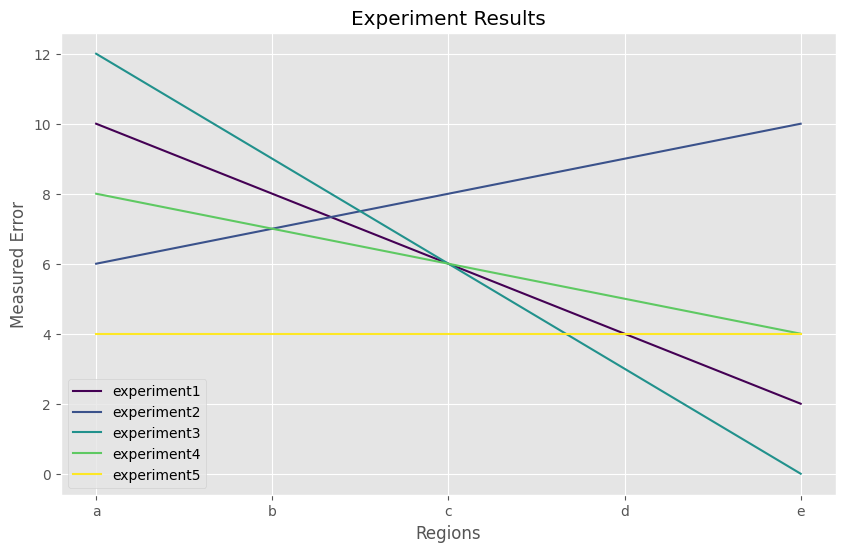

In [ ]:
# create a list of the regions
regions = ['a', 'b', 'c', 'd', 'e']

# create a dictionary with the experiment results
experiments = {
    'experiment1': [10, 8, 6, 4, 2],
    'experiment2': [6, 7, 8, 9, 10],
    'experiment3': [12, 9, 6, 3, 0],
    'experiment4': [8, 7, 6, 5, 4],
    'experiment5': [4, 4, 4, 4, 4]
}

# create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 6))

# loop through the experiments and plot each line
for experiment, values in experiments.items():
    ax.plot(regions, values, label=experiment)

# set the axis labels and legend
ax.set_xlabel('Regions')
ax.set_ylabel('Measured Error')
ax.set_title('Experiment Results')
ax.legend()

# show the plot
plt.show()

In [ ]:
df[(df['region'] == 'A')&(df['multiplier'] == 0.25)&(df['train_size'] == 10)].mean()

C:\Users\troosma\AppData\Local\Temp\ipykernel_29144\3649948254.py:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df[(df['region'] == 'A')&(df['multiplier'] == 0.25)&(df['train_size'] == 10)].mean()


train_size                 10.000000
random_seed                 2.000000
multiplier                  0.250000
bpoints_in_a                7.000000
bpoints_in_b                4.600000
bpoints_in_c                2.400000
bpoints_in_d                0.400000
bpoints_in_e                0.000000
ext_bpoints_in_a           13.600000
ext_bpoints_in_b            8.600000
ext_bpoints_in_c            3.600000
ext_bpoints_in_d            1.200000
ext_bpoints_in_e            0.800000
abs_diff_in_a              -0.348758
abs_diff_in_b              -0.741961
abs_diff_in_c              -0.550995
abs_diff_in_d              -1.424963
abs_diff_in_e              -2.297287
rel_diff_in_a              -1.683384
rel_diff_in_b              -1.660356
rel_diff_in_c              -1.290814
rel_diff_in_d              -1.590685
rel_diff_in_e              -1.804457
raw_mean2_in_a              0.318286
raw_mean2_in_b              0.447277
raw_mean2_in_c              1.290214
raw_mean2_in_d              0.975585
r

In [ ]:
df_2 = df.groupby(['region', 'multiplier', 'train_size']).mean().reset_index()
df_2
# df_2.reset_index(inplace=True)
# sns.barplot(x='A', y='B', data=df_2);



,region,multiplier,train_size,random_seed,bpoints_in_a,bpoints_in_b,bpoints_in_c,bpoints_in_d,bpoints_in_e,ext_bpoints_in_a,...,raw_mean2_in_d,raw_mean2_in_e,raw_mean3_in_a,raw_mean3_in_b,raw_mean3_in_c,raw_mean3_in_d,raw_mean3_in_e,points_in_equal_regions,points_in_diff_region,total_points
0,A,0.25,10,2.0,7.0,4.6,2.4,0.4,0.0,13.6,...,0.975585,0.557305,0.667044,1.189238,1.841209,2.400548,2.854592,2.0,0.0,8.0
1,A,0.25,20,2.0,5.6,2.4,0.6,0.2,0.0,11.2,...,2.254769,2.780720,0.596274,1.006193,1.544099,2.174497,2.775782,4.0,1.0,17.0
2,A,0.25,30,2.0,3.4,6.6,1.8,0.0,0.0,11.6,...,2.252303,2.615842,0.489134,1.159714,1.536453,2.235472,3.084342,6.0,1.0,25.0
3,A,0.25,40,2.0,6.6,4.8,1.6,0.2,0.2,13.2,...,1.369364,1.822075,0.549896,1.091912,1.580449,2.259144,3.000289,8.0,2.0,34.0
4,A,0.25,50,2.0,6.6,2.6,1.4,0.6,0.0,13.4,...,1.715328,2.391290,0.632477,1.036879,1.562713,2.156092,2.772477,10.0,2.0,42.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,E,4.00,200,2.0,7.4,3.0,3.2,0.2,0.0,12.8,...,2.171438,2.767723,0.466392,1.002370,1.516076,2.107233,2.708951,40.0,160.0,320.0
469,E,4.00,250,2.0,7.4,5.6,0.8,0.2,0.0,15.2,...,1.989307,2.553435,0.456908,1.003442,1.527225,2.112613,2.697559,50.0,200.0,400.0
470,E,4.00,500,2.0,8.0,3.6,1.8,0.2,0.0,15.6,...,1.992869,2.694847,0.450068,1.002667,1.517737,2.105580,2.669842,100.0,400.0,800.0
471,E,4.00,750,2.0,8.6,2.8,0.8,0.8,0.0,14.8,...,2.116842,2.674646,0.449841,0.990946,1.511899,2.101476,2.671087,150.0,600.0,1200.0


<AxesSubplot: xlabel='abs_diff_in_b', ylabel='raw_mean2_in_b'>

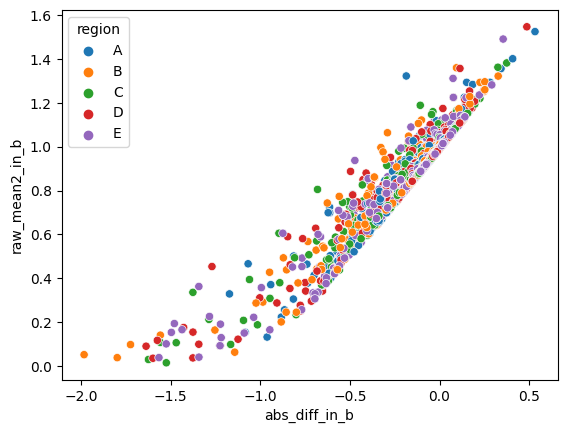

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.scatterplot(ax=ax[0], data=df, x="abs_diff_in_a",y="raw_mean2_in_a", hue="region",)
sns.scatterplot(ax=ax[1], data=df, x="abs_diff_in_a",y="raw_mean3_in_a", hue="region",)

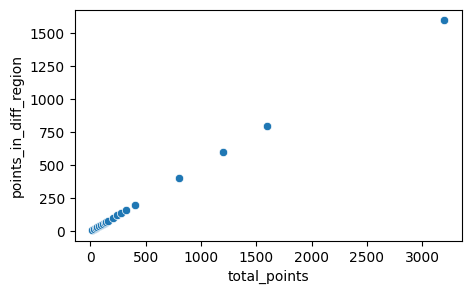

In [ ]:
letter = "C"
test_df = df.copy()
test_df["points_in_diff_region_dummy"] = test_df["points_in_diff_region"].apply(lambda x: round(x/1,0)*1)
test_df = test_df[(test_df["region"]=="C")&(test_df["multiplier"]==4)].groupby(["points_in_diff_region_dummy"]).mean(numeric_only=True).reset_index()

regions = ['A', 'B', 'C', 'D', 'E']
fig, ax = plt.subplots(figsize=(5, 3))
diverging_colors = sns.color_palette("mako", test_df.shape[1])

sns.scatterplot(data = test_df, x="total_points",y="points_in_diff_region")

plt.show()



In [ ]:
len([10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 125, 150, 175, 200, 250, 500, 750, 1000, 2000])

19

<AxesSubplot: xlabel='points_in_equal_regions', ylabel='bpoints_in_a'>

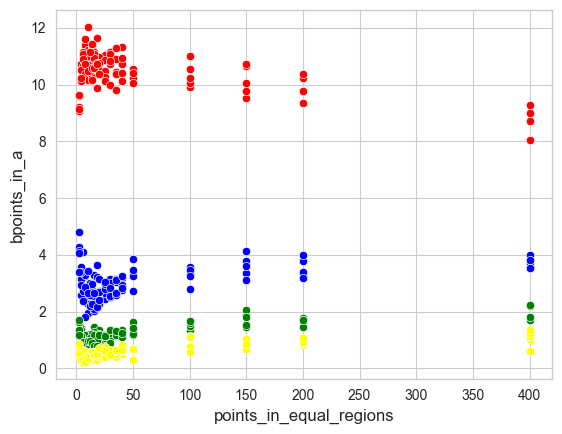

In [72]:
test_df = df[df.region=="E"]
sns.scatterplot(data = test_df, x="points_in_equal_regions",y="bpoints_in_a",color="red")
sns.scatterplot(data = test_df, x="points_in_equal_regions",y="bpoints_in_b",color="blue")
sns.scatterplot(data = test_df, x="points_in_equal_regions",y="bpoints_in_c",color="green")
sns.scatterplot(data = test_df, x="points_in_equal_regions",y="bpoints_in_d",color="yellow")

<AxesSubplot: xlabel='points_in_equal_regions', ylabel='bpoints_in_a'>

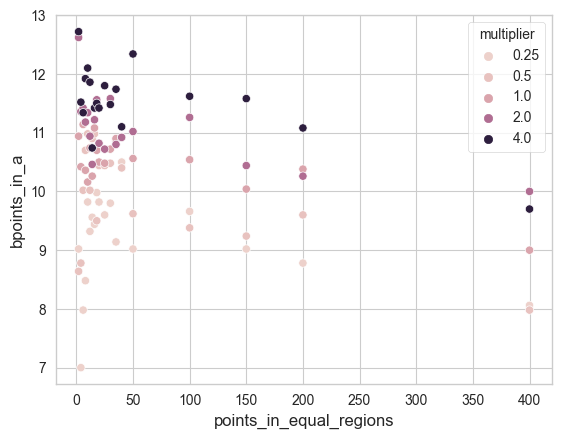

In [78]:
test_df = df[df.region=="A"]
sns.scatterplot(data = test_df, x="points_in_equal_regions",y="bpoints_in_a",hue="multiplier")
# sns.scatterplot(data = test_df, x="points_in_equal_regions",y="bpoints_in_b",hue="multiplier")
# sns.scatterplot(data = test_df, x="points_in_equal_regions",y="bpoints_in_c",hue="multiplier")
# sns.scatterplot(data = test_df, x="points_in_equal_regions",y="bpoints_in_d",hue="multiplier")
# sns.scatterplot(data = test_df, x="points_in_equal_regions",y="bpoints_in_e",hue="multiplier")

In [86]:
from matplotlib.colors import LogNorm

<AxesSubplot: xlabel='bpoints_in_a', ylabel='rel_diff_in_a'>

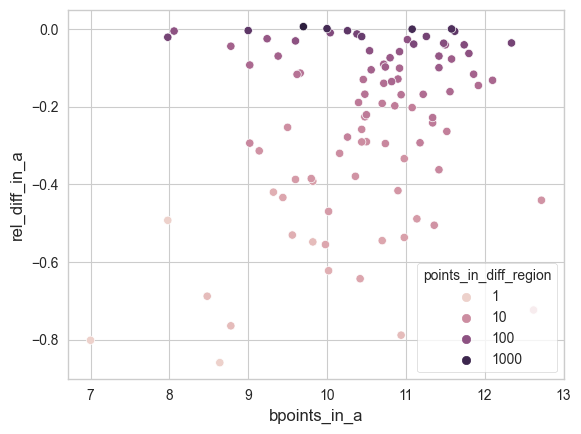

In [89]:
test_df = df[(df.region=="A")&(df.points_in_diff_region!=0)]
sns.scatterplot(data = test_df, x="bpoints_in_a",y="rel_diff_in_a",hue="points_in_diff_region",hue_norm=LogNorm() )
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_b",hue="multiplier")
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_c",hue="multiplier")
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_d",hue="multiplier")
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_e",hue="multiplier")

<AxesSubplot: xlabel='points_in_diff_region', ylabel='rel_diff_in_a'>

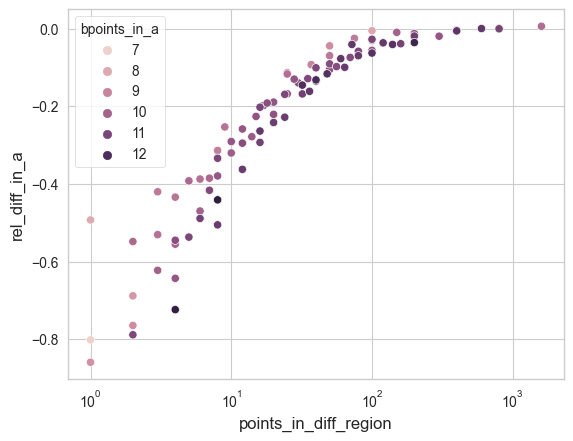

In [98]:
test_df = df[(df.region=="A")&(df.points_in_diff_region!=0)]
fig, ax = plt.subplots()
ax.set_xscale( "log")
sns.scatterplot(data = test_df, x="points_in_diff_region",y="rel_diff_in_a",hue="bpoints_in_a",ax=ax)#hue_norm=LogNorm() )
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_b",hue="multiplier")
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_c",hue="multiplier")
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_d",hue="multiplier")
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_e",hue="multiplier")

<AxesSubplot: xlabel='points_in_diff_region', ylabel='rel_diff_in_c'>

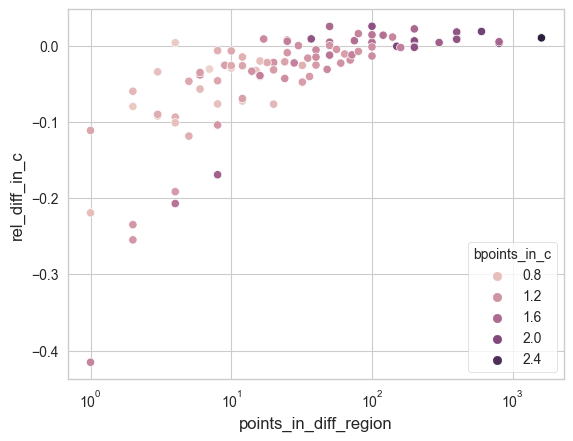

In [99]:
test_df = df[(df.region=="C")&(df.points_in_diff_region!=0)]
fig, ax = plt.subplots()
ax.set_xscale( "log")
sns.scatterplot(data = test_df, x="points_in_diff_region",y="rel_diff_in_c",hue="bpoints_in_c",ax=ax)#hue_norm=LogNorm() )
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_b",hue="multiplier")
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_c",hue="multiplier")
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_d",hue="multiplier")
# sns.scatterplot(data = test_df, x="bpoints_in_",y="rel_diff_in_e",hue="multiplier")